# Deep Learning and its Applications to Signal and ImageProcessing and Analysis
## 361.2.1120
### Final Project

 Tomer Abram - 208931691

 Laith Sadik - 318679677

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

save_dir = '/content/drive/MyDrive/fp'
os.makedirs(save_dir, exist_ok=True)

In [3]:
!pip install kaggle

In [4]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [5]:
!kaggle datasets download "joe1995/div2k-dataset"

Dataset URL: https://www.kaggle.com/datasets/joe1995/div2k-dataset
License(s): unknown
 99% 3.67G/3.71G [00:41<00:00, 54.3MB/s]
100% 3.71G/3.71G [00:41<00:00, 96.5MB/s]


In [6]:
!unzip div2k-dataset.zip

Archive:  div2k-dataset.zip
  inflating: DIV2K_train_HR/DIV2K_train_HR/0001.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0002.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0003.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0004.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0005.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0006.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0007.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0008.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0009.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0010.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0011.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0012.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0013.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0014.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0015.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0016.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0017.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0018.png  


In [7]:
!pip install scikit-image
!pip install pytorch-fid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 119.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

# Import important libraries

In [8]:
import PIL  #(Pillow)
from PIL import Image
import numpy as np
from numpy import asarray
import pandas as pd
import os
import cv2
import imageio
import dlib
import seaborn as sns
import json
import random
import torch
import torchvision
import torchvision.transforms.functional as FT
from torchvision import transforms as transforms
import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch import nn
from torch import tensor
from torch.utils import data
from torch.utils.data import Dataset
import torch.backends.cudnn as cudnn
import math
from math import exp, log10, sqrt
import matplotlib.pyplot as plt
import time
import skimage
from skimage.io import imread, imsave
from skimage.color import rgb2gray
from skimage.transform import resize,rescale
from urllib.request import urlopen
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim
from pytorch_fid import fid_score
import tempfile
import shutil
import torchvision.utils as vutils
import pickle
import torch.nn as nn
import torch.utils.data as data
from torchvision.transforms import ToTensor
from glob import glob
from torchvision.transforms import Compose, Resize, ToTensor
import torch.optim as optim
from tqdm import tqdm
import torchvision.transforms as transforms
import torchvision.transforms as T

#3.3) Data Visualization

In [9]:

num_in_row = 6
num_in_col = 3
path = './DIV2K_train_HR/DIV2K_train_HR'
full_img = None
line_img = None
files = [os.path.join(path, file) for file in np.random.choice(os.listdir(path), size=num_in_row * num_in_col)]

for i, file in enumerate(files):
    img = resize(imread(file), (256, 256))
    if line_img is None:
        line_img = img
        continue

    if (i) % (num_in_row) != 0:
        line_img = np.concatenate((line_img, img), axis=1)
    elif full_img is None:
        full_img = line_img.copy()
        line_img = img
    else:
        full_img = np.concatenate((full_img, line_img), axis=0)
        line_img = img
full_img = np.concatenate((full_img, line_img), axis=0)

(np.float64(-0.5), np.float64(1535.5), np.float64(767.5), np.float64(-0.5))

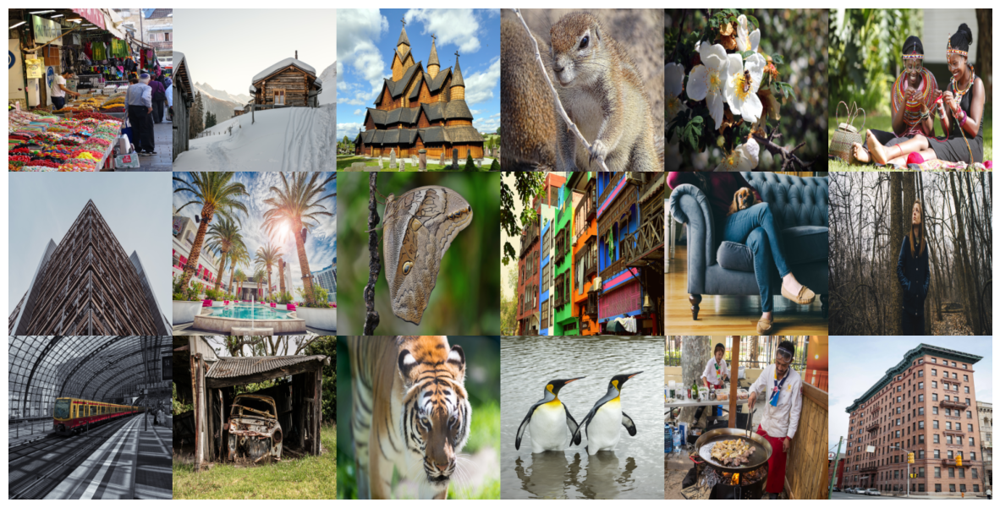

In [10]:
plt.figure(figsize=(15,15))
plt.imshow(full_img)
plt.axis('off')


# 3.3.2) Types of some images DataSet includes:

In [11]:
# Path to the original image folder
hr_dir = './DIV2K_valid_HR/DIV2K_valid_HR'  # Change as needed

# Get a list of files with image extensions only
image_files = sorted([
    f for f in os.listdir(hr_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])[:6] # Select only first 6 images

# Show 6 images
plt.figure(figsize=(15, 10))
for i, filename in enumerate(image_files):
    img_path = os.path.join(hr_dir, filename)
    img = Image.open(img_path).convert('RGB')

    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

#3.3.2) The pixel distribution of the images of DIV2K:

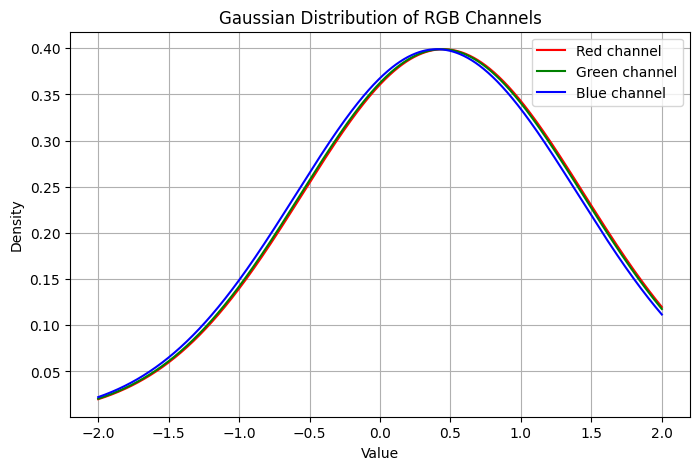

In [12]:

# The average and standard deviation values ​​from each channel
rgb_mean = [0.4488, 0.4371, 0.4040]
rgb_std = [1.0, 1.0, 1.0]

colors = ['red', 'green', 'blue']
x = np.linspace(-2, 2, 1000)

plt.figure(figsize=(8, 5))
for i in range(3):
    mu = rgb_mean[i]
    sigma = rgb_std[i]
    y = (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(- (x - mu)**2 / (2 * sigma**2))
    plt.plot(x, y, label=f'{colors[i].capitalize()} channel', color=colors[i])

plt.title("Gaussian Distribution of RGB Channels")
plt.xlabel("Value")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()

# 3.4.1 Option 1: Baseline Model (Kaggle)

# Constants

In [13]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Some constants
rgb_weights = torch.FloatTensor([65.481, 128.553, 24.966]).to(device)


def convert_image(img, source, target):
    """
    Convert an image from a source format to a target format.
    :param img: image
    :param source: source format, one of 'pil' (PIL image), '[0, 1]' or '[-1, 1]' (pixel value ranges)
    :param target: target format, one of 'pil' (PIL image), '[0, 255]', '[0, 1]', '[-1, 1]' (pixel value ranges),
                   'y-channel' (luminance channel Y in the YCbCr color format, used to calculate PSNR and SSIM)
    :return: converted image
    """
    assert source in {'pil', '[0, 1]', '[-1, 1]'}, "Cannot convert from source format %s!" % source
    assert target in {'pil', '[0, 255]', '[0, 1]', '[-1, 1]',
                      'y-channel'}, "Cannot convert to target format %s!" % target

    # Convert from source to [0, 1]
    if source == 'pil':
        img = FT.to_tensor(img)

    elif source == '[0, 1]':
        pass  # already in [0, 1]

    elif source == '[-1, 1]':
        img = (img + 1.) / 2.

    # Convert from [0, 1] to target
    if target == 'pil':
        img = FT.to_pil_image(img)

    elif target == '[0, 255]':
        img = 255. * img

    elif target == '[0, 1]':
        pass  # already in [0, 1]

    elif target == '[-1, 1]':
        img = 2. * img - 1.

    elif target == 'y-channel':
        img = torch.matmul(255. * img.permute(0, 2, 3, 1)[:, 4:-4, 4:-4, :], rgb_weights) / 255. + 16.

    return img


class ImageTransforms(object):
    """
    Image transformation pipeline.
    """

    def __init__(self, split, crop_size, scaling_factor, lr_img_type, hr_img_type):
        """
        :param split: one of 'train' or 'test'
        :param crop_size: crop size of HR images
        :param scaling_factor: LR images will be downsampled from the HR images by this factor
        :param lr_img_type: the target format for the LR image; see convert_image() above for available formats
        :param hr_img_type: the target format for the HR image; see convert_image() above for available formats
        """
        self.split = split.lower()
        self.crop_size = crop_size
        self.scaling_factor = scaling_factor
        self.lr_img_type = lr_img_type
        self.hr_img_type = hr_img_type

        assert self.split in {'train', 'valid'}

    def __call__(self, img):
        """
        :param img: a PIL source image from which the HR image will be cropped, and then downsampled to create the LR image
        :return: LR and HR images in the specified format
        """

        # Crop
        if self.split == 'train':
            # Take a random fixed-size crop of the image, which will serve as the high-resolution (HR) image
            left = random.randint(1, img.width - self.crop_size)
            top = random.randint(1, img.height - self.crop_size)
            right = left + self.crop_size
            bottom = top + self.crop_size
            hr_img = img.crop((left, top, right, bottom))
        elif self.split == 'valid':
            # Take a random fixed-size crop of the image, which will serve as the high-resolution (HR) image
            left = random.randint(1, img.width - self.crop_size)
            top = random.randint(1, img.height - self.crop_size)
            right = left + self.crop_size
            bottom = top + self.crop_size
            hr_img = img.crop((left, top, right, bottom))
        else:
            # Take the largest possible center-crop of it such that its dimensions are perfectly divisible by the scaling factor
            x_remainder = img.width % self.scaling_factor
            y_remainder = img.height % self.scaling_factor
            left = x_remainder // 2
            top = y_remainder // 2
            right = left + (img.width - x_remainder)
            bottom = top + (img.height - y_remainder)
            hr_img = img.crop((left, top, right, bottom))

        lr_img = hr_img.resize((int(hr_img.width / self.scaling_factor), int(hr_img.height / self.scaling_factor)),
                               Image.BICUBIC)

        assert hr_img.width == lr_img.width * self.scaling_factor and hr_img.height == lr_img.height * self.scaling_factor

        lr_img = convert_image(lr_img, source='pil', target=self.lr_img_type)
        hr_img = convert_image(hr_img, source='pil', target=self.hr_img_type)

        return lr_img, hr_img


class AverageMeter(object):
    """
    Keeps track of most recent, average, sum, and count of a metric.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def clip_gradient(optimizer, grad_clip):
    """
    Clips gradients computed during backpropagation to avoid explosion of gradients.
    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups:
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)


def save_checkpoint(state, filename):
    """
    Save model checkpoint.
    :param state: checkpoint contents
    """
    torch.save(state, filename)


def adjust_learning_rate(optimizer, shrink_factor):
    """
    Shrinks learning rate by a specified factor.
    :param optimizer: optimizer whose learning rate must be shrunk.
    :param shrink_factor: factor in interval (0, 1) to multiply learning rate with.
    """

    print("\nDECAYING learning rate.")
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * shrink_factor
    print("The new learning rate is %f\n" % (optimizer.param_groups[0]['lr'],))# This Python 3 environment comes with many helpful analytics libraries installed

import numpy as np
import pandas as pd

# Now we have to build the class Dataset

In [14]:

class SRDataset(Dataset):
    """
    A PyTorch Dataset to be used by a PyTorch DataLoader.
    """

    def __init__(self, data_folder, split, crop_size, scaling_factor, lr_img_type, hr_img_type):
        """
        :param data_folder: data with images
        :param split: one of 'train' or 'valid'
        :param crop_size: crop size of target HR images
        :param scaling_factor: the input LR images will be downsampled from the target HR images by this factor; the scaling done in the super-resolution
        :param lr_img_type: the format for the LR image supplied to the model; see convert_image() in utils.py for available formats
        :param hr_img_type: the format for the HR image supplied to the model; see convert_image() in utils.py for available formats
        """

        self.data_folder = data_folder
        self.split = split.lower()
        self.crop_size = int(crop_size)
        self.scaling_factor = int(scaling_factor)
        self.lr_img_type = lr_img_type
        self.hr_img_type = hr_img_type


        assert lr_img_type in {'[0, 255]', '[0, 1]', '[-1, 1]'}
        assert hr_img_type in {'[0, 255]', '[0, 1]', '[-1, 1]'}

        if self.split == 'train':
            assert self.crop_size % self.scaling_factor == 0, "Crop dimensions are not perfectly divisible by scaling factor! This will lead to a mismatch in the dimensions of the original HR patches and their super-resolved (SR) versions!"

        # Read list of image-paths
        if self.split == 'train':
            path = os.path.join(data_folder, 'DIV2K_train_HR','DIV2K_train_HR')
        else:
            path = os.path.join(data_folder, 'DIV2K_valid_HR', 'DIV2K_valid_HR')

        self.images = [os.path.join(path, file) for file in sorted(os.listdir(path))]

        # Select the correct set of transforms
        self.transform = ImageTransforms(split=self.split,
                                         crop_size=self.crop_size,
                                         scaling_factor=self.scaling_factor,
                                         lr_img_type=self.lr_img_type,
                                         hr_img_type=self.hr_img_type)

    def __getitem__(self, i):
        """
        This method is required to be defined for use in the PyTorch DataLoader.
        :param i: index to retrieve
        :return: the 'i'th pair LR and HR images to be fed into the model
        """
        # Read image
        img = Image.open(self.images[i], mode='r')
        img = img.convert('RGB')
        if img.width <= 96 or img.height <= 96:
            print(self.images[i], img.width, img.height)
        lr_img, hr_img = self.transform(img)

        return lr_img, hr_img

    def __len__(self):
        """
        This method is required to be defined for use in the PyTorch DataLoader.
        :return: size of this data (in number of images)
        """
        return len(self.images)

# Convolutional and training model

In [15]:

class ConvolutionalBlock(nn.Module):
    """
    A convolutional block, comprising convolutional, BN, activation layers.
    """

    def __init__(self, in_channels, out_channels, kernel_size, stride=1, batch_norm=False, activation=None):
        """
        :param in_channels: number of input channels
        :param out_channels: number of output channe;s
        :param kernel_size: kernel size
        :param stride: stride
        :param batch_norm: include a BN layer?
        :param activation: Type of activation; None if none
        """
        super(ConvolutionalBlock, self).__init__()

        if activation is not None:
            activation = activation.lower()
            assert activation in {'prelu', 'leakyrelu', 'tanh', 'sigmoid'}

        # A container that will hold the layers in this convolutional block
        layers = list()

        # A convolutional layer
        layers.append(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride,
                      padding=kernel_size // 2))

        # A batch normalization (BN) layer, if wanted
        if batch_norm is True:
            layers.append(nn.BatchNorm2d(num_features=out_channels))

        # An activation layer, if wanted
        if activation == 'prelu':
            layers.append(nn.PReLU())
        elif activation == 'leakyrelu':
            layers.append(nn.LeakyReLU(0.2))
        elif activation == 'tanh':
            layers.append(nn.Tanh())
        elif activation == 'sigmoid':
            layers.append(nn.Sigmoid())

        # Put together the convolutional block as a sequence of the layers in this container
        self.conv_block = nn.Sequential(*layers)

    def forward(self, input):
        """
        Forward propagation.
        :param input: input images, a tensor of size (N, in_channels, w, h)
        :return: output images, a tensor of size (N, out_channels, w, h)
        """
        output = self.conv_block(input)  # (N, out_channels, w, h)

        return output


class SubPixelConvolutionalBlock(nn.Module):
    """
    A subpixel convolutional block, comprising convolutional, pixel-shuffle, and PReLU activation layers.
    """

    def __init__(self, kernel_size=3, n_channels=64, scaling_factor=2):
        """
        :param kernel_size: kernel size of the convolution
        :param n_channels: number of input and output channels
        :param scaling_factor: factor to scale input images by (along both dimensions)
        """
        super(SubPixelConvolutionalBlock, self).__init__()

        # A convolutional layer that increases the number of channels by scaling factor^2, followed by pixel shuffle and PReLU
        self.conv = nn.Conv2d(in_channels=n_channels, out_channels=n_channels * (scaling_factor ** 2),
                              kernel_size=kernel_size, padding=kernel_size // 2)
        # These additional channels are shuffled to form additional pixels, upscaling each dimension by the scaling factor
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor=scaling_factor)
        self.prelu = nn.PReLU()

    def forward(self, input):
        """
        Forward propagation.
        :param input: input images, a tensor of size (N, n_channels, w, h)
        :return: scaled output images, a tensor of size (N, n_channels, w * scaling factor, h * scaling factor)
        """
        output = self.conv(input)
        output = self.pixel_shuffle(output)
        output = self.prelu(output)

        return output




# Class SRResNet

In [16]:
class ResidualBlock(nn.Module):
    """
    A residual block, comprising two convolutional blocks with a residual connection across them.
    """

    def __init__(self, kernel_size=3, n_channels=64):
        """
        :param kernel_size: kernel size
        :param n_channels: number of input and output channels (same because the input must be added to the output)
        """
        super(ResidualBlock, self).__init__()

        # The first convolutional block
        self.conv_block1 = ConvolutionalBlock(in_channels=n_channels, out_channels=n_channels, kernel_size=kernel_size,
                                              batch_norm=True, activation='PReLu')

        # The second convolutional block
        self.conv_block2 = ConvolutionalBlock(in_channels=n_channels, out_channels=n_channels, kernel_size=kernel_size,
                                              batch_norm=True, activation=None)

    def forward(self, input):
        """
        Forward propagation.
        :param input: input images, a tensor of size (N, n_channels, w, h)
        :return: output images, a tensor of size (N, n_channels, w, h)
        """
        residual = input  # (N, n_channels, w, h)
        output = self.conv_block1(input)  # (N, n_channels, w, h)
        output = self.conv_block2(output)  # (N, n_channels, w, h)
        output = output + residual  # (N, n_channels, w, h)

        return output


class SRResNet(nn.Module):
    """
    The SRResNet, as defined in the paper.
    """

    def __init__(self, large_kernel_size=9, small_kernel_size=3, n_channels=64, n_blocks=16, scaling_factor=4):
        """
        :param large_kernel_size: kernel size of the first and last convolutions which transform the inputs and outputs
        :param small_kernel_size: kernel size of all convolutions in-between, i.e. those in the residual and subpixel convolutional blocks
        :param n_channels: number of channels in-between, i.e. the input and output channels for the residual and subpixel convolutional blocks
        :param n_blocks: number of residual blocks
        :param scaling_factor: factor to scale input images by (along both dimensions) in the subpixel convolutional block
        """
        super(SRResNet, self).__init__()

        # Scaling factor must be 2, 4, or 8
        scaling_factor = int(scaling_factor)
        assert scaling_factor in {2, 4, 8}, "The scaling factor must be 2, 4, or 8!"

        # The first convolutional block
        self.conv_block1 = ConvolutionalBlock(in_channels=3, out_channels=n_channels, kernel_size=large_kernel_size,
                                              batch_norm=False, activation='PReLu')

        # A sequence of n_blocks residual blocks, each containing a skip-connection across the block
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(kernel_size=small_kernel_size, n_channels=n_channels) for i in range(n_blocks)])

        # Another convolutional block
        self.conv_block2 = ConvolutionalBlock(in_channels=n_channels, out_channels=n_channels,
                                              kernel_size=small_kernel_size,
                                              batch_norm=True, activation=None)

        # Upscaling is done by sub-pixel convolution, with each such block upscaling by a factor of 2
        n_subpixel_convolution_blocks = int(math.log2(scaling_factor))
        self.subpixel_convolutional_blocks = nn.Sequential(
            *[SubPixelConvolutionalBlock(kernel_size=small_kernel_size, n_channels=n_channels, scaling_factor=2) for i
              in range(n_subpixel_convolution_blocks)])

        # The last convolutional block
        self.conv_block3 = ConvolutionalBlock(
            in_channels=n_channels,
            out_channels=3,
            kernel_size=large_kernel_size,
            batch_norm=False,
            activation='tanh')

    def forward(self, lr_imgs):
        """
        Forward prop.
        :param lr_imgs: low-resolution input images, a tensor of size (N, 3, w, h)
        :return: super-resolution output images, a tensor of size (N, 3, w * scaling factor, h * scaling factor)
        """
        output = self.conv_block1(lr_imgs)  # (N, 3, w, h)
        residual = output  # (N, n_channels, w, h)
        output = self.residual_blocks(output)  # (N, n_channels, w, h)
        output = self.conv_block2(output)  # (N, n_channels, w, h)
        output = output + residual  # (N, n_channels, w, h)
        output = self.subpixel_convolutional_blocks(output)  # (N, n_channels, w * scaling factor, h * scaling factor)
        sr_imgs = self.conv_block3(output)  # (N, 3, w * scaling factor, h * scaling factor)

        return sr_imgs

# Execution

In [17]:
# Data parameters
data_folder = './'  # folder with JSON data files
crop_size = 96  # crop size of target HR images
scaling_factor = 4  # the scaling factor for the generator; the input LR images will be downsampled from the target HR images by this factor

# Model parameters
large_kernel_size = 9  # kernel size of the first and last convolutions which transform the inputs and outputs
small_kernel_size = 3  # kernel size of all convolutions in-between, i.e. those in the residual and subpixel convolutional blocks
n_channels = 128  # number of channels in-between, i.e. the input and output channels for the residual and subpixel convolutional blocks
n_blocks = 32  # number of residual blocks

# Learning parameters
'''
if os.path.exists('./checkpoint_srresnet.pth.tar'):
    print('Read from ./checkpoint_srresnet.pth.tar')
    checkpoint = './checkpoint_srresnet.pth.tar'
else:
    checkpoint = None  # path to model checkpoint, None if none
    print('Ther are no any Weights!')
'''

metrics_df = pd.DataFrame({
    'Epoch': pd.Series(dtype='int'),
    'PSNR': pd.Series(dtype='float'),
    'SSIM': pd.Series(dtype='float'),
    'FID': pd.Series(dtype='float'),
})

checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")


if os.path.exists(checkpoint_path):
    print(f'Read from {checkpoint_path}')
    checkpoint = checkpoint_path
else:
    checkpoint = None
    print('There are no any Weights!')

batch_size = 32  # batch size

start_epoch = 0  # start at this epoch
epochs = 50  # number of training iterations

workers = 4  # number of workers for loading data in the DataLoader
print_freq = 500  # print training status once every __ batches
lr = 1e-4  # learning rate
grad_clip = None  # clip if gradients are exploding

cudnn.benchmark = True

loss_curve_train = []
loss_curve_valid = []


def main():
    """
    Training.
    """
    global start_epoch, epoch, checkpoint, metrics_df
    #checkpoint = "./checkpoint_srresnet.pth.tar"


    # Initialize model or load checkpoint
    if checkpoint is None:
        model = SRResNet(large_kernel_size=large_kernel_size, small_kernel_size=small_kernel_size,
                         n_channels=n_channels, n_blocks=n_blocks, scaling_factor=scaling_factor)
        # Initialize the optimizer
        optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, model.parameters()),
                                     lr=lr)

    else:
        checkpoint = torch.load(checkpoint, weights_only=False)
        start_epoch = checkpoint['epoch'] + 1
        model = checkpoint['model']
        optimizer = checkpoint['optimizer']

    # Move to default device
    model = model.to(device)
    criterion = nn.L1Loss().to(device)

    # Custom dataloaders
    train_dataset = SRDataset(data_folder,
                              split='train',
                              crop_size=crop_size,
                              scaling_factor=scaling_factor,
                              lr_img_type='[-1, 1]',
                              hr_img_type='[-1, 1]')

    valid_dataset = SRDataset(data_folder,
                              split='valid',
                              crop_size=crop_size,
                              scaling_factor=scaling_factor,
                              lr_img_type='[-1, 1]',
                              hr_img_type='[-1, 1]')

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=workers,
        pin_memory=True)

    valid_loader = torch.utils.data.DataLoader(
        valid_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=workers,
        pin_memory=True)

    train_losses = []
    val_losses = []
    val_psnrs = []
    val_ssims = []
    val_fids = []
    # Epochs
    for epoch in range(start_epoch, epochs):
        # One epoch's training
        train_losses = train(train_loader=train_loader,
              model=model,
              criterion=criterion,
              optimizer=optimizer)

        valid_losses, avg_psnr, avg_ssim, fid_score_val = valid(valid_loader=valid_loader,
              model=model,
              criterion=criterion)

        if epoch%10==0 or epoch==49:
              new_row = {'Epoch': epoch, 'PSNR': avg_psnr, 'SSIM': avg_ssim, 'FID': fid_score_val}
              if not metrics_df.empty:
                  metrics_df = pd.concat([metrics_df, pd.DataFrame([new_row])], ignore_index=True)
              else:
                  metrics_df = pd.DataFrame([new_row])
              metrics_df.to_csv(os.path.join(save_dir, 'kaggle_training_metrics.csv'), index=False)

        print('Epoch: [{0}] ---- '
              'Train Average Loss: {train_loss.avg:.4f} ---- '
              'Valid Average Loss: {valid_loss.avg:.4f}'
              .format(epoch,
                      train_loss=train_losses,
                      valid_loss=valid_losses))

        loss_curve_train.append(train_losses.avg)
        loss_curve_valid.append(valid_losses.avg)
        val_psnrs.append(avg_psnr)
        val_ssims.append(avg_ssim)
        val_fids.append(fid_score_val)

        print("Training history saved.")

        # Save checkpoint
        # 'checkpoint_srresnet.pth.tar'

        torch.save({
            'epoch': epoch,
            'model': model,
            'optimizer': optimizer
        }, os.path.join(save_dir, 'checkpoint_srresnet.pth.tar'))
    print(metrics_df)
    history = {
            'train_losses': loss_curve_train,
            'val_losses': loss_curve_valid,
            'val_psnrs': val_psnrs,
            'val_ssims': val_ssims,
            'val_fids': val_fids
        }


    with open(os.path.join(save_dir, 'kaggle_option_training_history.pkl'), 'wb') as f:pickle.dump(history, f)

def train(train_loader, model, criterion, optimizer):
    """
    One epoch's training.
    :param train_loader: DataLoader for training data
    :param model: model
    :param criterion: content loss function (Mean Squared-Error loss)
    :param optimizer: optimizer
    :param epoch: epoch number
    """
    model.train()  # training mode enables batch normalization

    data_time = AverageMeter()
    losses = AverageMeter()

    for i, (lr_imgs, hr_imgs) in enumerate(train_loader):

        lr_imgs = lr_imgs.to(device)
        hr_imgs = hr_imgs.to(device)

        sr_imgs = model(lr_imgs)

        loss = criterion(sr_imgs, hr_imgs)

        optimizer.zero_grad()
        loss.backward()

        if grad_clip is not None:
            clip_gradient(optimizer, grad_clip)

        optimizer.step()

        # Keep track of loss
        losses.update(loss.item(), lr_imgs.size(0))

    del lr_imgs, hr_imgs, sr_imgs  # free some memory since their histories may be stored
    return losses


def valid(valid_loader, model, criterion):
    """
    One epoch's training.
    :param train_loader: DataLoader for training data
    :param model: model
    :param criterion: content loss function (Mean Squared-Error loss)
    :param optimizer: optimizer
    :param epoch: epoch number
    """
    model.eval()

    data_time = AverageMeter()
    losses = AverageMeter()
    psnr_total = 0.0
    ssim_total = 0.0
    num_images = 0
    # Temporary folders for FID
    temp_real_dir = tempfile.mkdtemp()
    temp_fake_dir = tempfile.mkdtemp()

    to_pil = transforms.ToPILImage()


    for i, (lr_imgs, hr_imgs) in enumerate(valid_loader):
        # Move to default device
        lr_imgs = lr_imgs.to(device)  # (batch_size (N), 3, 24, 24), imagenet-normed
        hr_imgs = hr_imgs.to(device)  # (batch_size (N), 3, 96, 96), in [-1, 1]

        with torch.no_grad():
            # Forward prop.
            sr_imgs = model(lr_imgs)# (N, 3, 96, 96), in [-1, 1]

        loss = criterion(sr_imgs, hr_imgs)# Loss
        losses.update(loss.item(), lr_imgs.size(0))# Keep track of loss

        # Convert from [-1, 1] to [0, 1]
        sr_imgs_clamped = ((sr_imgs + 1) / 2).clamp(0, 1).cpu()
        hr_imgs_clamped = ((hr_imgs + 1) / 2).clamp(0, 1).cpu()

        for idx in range(sr_imgs.size(0)):
            sr_img = to_pil(sr_imgs_clamped[idx])
            hr_img = to_pil(hr_imgs_clamped[idx])

            sr_np = np.array(sr_img)
            hr_np = np.array(hr_img)

            psnr_total += compare_psnr(hr_np, sr_np, data_range=255)
            ssim_total += compare_ssim(hr_np, sr_np, channel_axis=2)
            num_images += 1

            # Save images for FID
            sr_img.save(os.path.join(temp_fake_dir, f"{i}_{idx}_fake.png"))
            hr_img.save(os.path.join(temp_real_dir, f"{i}_{idx}_real.png"))

    # PSNR & SSIM
    avg_psnr = psnr_total / num_images
    avg_ssim = ssim_total / num_images

    # FID
    fid = fid_score.calculate_fid_given_paths([temp_real_dir, temp_fake_dir],
                                              batch_size=50,
                                              device=device,
                                              dims=2048)

    # Clean up temp dirs
    shutil.rmtree(temp_real_dir)
    shutil.rmtree(temp_fake_dir)

    print(f"Validation Loss: {losses.avg:.4f}, PSNR: {avg_psnr:.2f}, SSIM: {avg_ssim:.4f}, FID: {fid:.2f}")

    del lr_imgs, hr_imgs, sr_imgs  # free some memory since their histories may be stored
    return losses, avg_psnr, avg_ssim, fid

if __name__ == '__main__':
    main()

There are no any Weights!


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:02<00:00, 39.9MB/s]
100%|██████████| 2/2 [00:00<00:00,  4.14it/s]


Validation Loss: 0.2505, PSNR: 16.69, SSIM: 0.3941, FID: 365.44
Epoch: [0] ---- Train Average Loss: 0.2659 ---- Valid Average Loss: 0.2505
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  4.09it/s]


Validation Loss: 0.1611, PSNR: 20.01, SSIM: 0.4647, FID: 373.30
Epoch: [1] ---- Train Average Loss: 0.1744 ---- Valid Average Loss: 0.1611
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  4.02it/s]


Validation Loss: 0.1266, PSNR: 21.93, SSIM: 0.5114, FID: 343.54
Epoch: [2] ---- Train Average Loss: 0.1483 ---- Valid Average Loss: 0.1266
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.96it/s]


Validation Loss: 0.1178, PSNR: 22.75, SSIM: 0.5555, FID: 351.16
Epoch: [3] ---- Train Average Loss: 0.1285 ---- Valid Average Loss: 0.1178
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.99it/s]


Validation Loss: 0.1129, PSNR: 23.12, SSIM: 0.5712, FID: 343.18
Epoch: [4] ---- Train Average Loss: 0.1229 ---- Valid Average Loss: 0.1129
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.91it/s]


Validation Loss: 0.1116, PSNR: 23.11, SSIM: 0.5862, FID: 327.64
Epoch: [5] ---- Train Average Loss: 0.1163 ---- Valid Average Loss: 0.1116
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Validation Loss: 0.1004, PSNR: 24.46, SSIM: 0.5881, FID: 322.01
Epoch: [6] ---- Train Average Loss: 0.1085 ---- Valid Average Loss: 0.1004
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Validation Loss: 0.1038, PSNR: 24.15, SSIM: 0.6215, FID: 324.33
Epoch: [7] ---- Train Average Loss: 0.1064 ---- Valid Average Loss: 0.1038
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  4.01it/s]


Validation Loss: 0.0956, PSNR: 24.74, SSIM: 0.6558, FID: 324.41
Epoch: [8] ---- Train Average Loss: 0.0963 ---- Valid Average Loss: 0.0956
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Validation Loss: 0.0911, PSNR: 25.21, SSIM: 0.6441, FID: 306.05
Epoch: [9] ---- Train Average Loss: 0.0968 ---- Valid Average Loss: 0.0911
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Validation Loss: 0.1029, PSNR: 24.11, SSIM: 0.6271, FID: 318.81
Epoch: [10] ---- Train Average Loss: 0.0931 ---- Valid Average Loss: 0.1029
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


Validation Loss: 0.0896, PSNR: 25.28, SSIM: 0.6491, FID: 303.87
Epoch: [11] ---- Train Average Loss: 0.0931 ---- Valid Average Loss: 0.0896
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Validation Loss: 0.0868, PSNR: 25.36, SSIM: 0.6657, FID: 300.37
Epoch: [12] ---- Train Average Loss: 0.0884 ---- Valid Average Loss: 0.0868
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  4.01it/s]


Validation Loss: 0.0966, PSNR: 24.91, SSIM: 0.6558, FID: 304.60
Epoch: [13] ---- Train Average Loss: 0.0881 ---- Valid Average Loss: 0.0966
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Validation Loss: 0.0889, PSNR: 25.47, SSIM: 0.6594, FID: 307.32
Epoch: [14] ---- Train Average Loss: 0.0862 ---- Valid Average Loss: 0.0889
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.99it/s]


Validation Loss: 0.0829, PSNR: 26.25, SSIM: 0.7010, FID: 306.23
Epoch: [15] ---- Train Average Loss: 0.0846 ---- Valid Average Loss: 0.0829
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.98it/s]


Validation Loss: 0.0943, PSNR: 24.77, SSIM: 0.6818, FID: 283.55
Epoch: [16] ---- Train Average Loss: 0.0891 ---- Valid Average Loss: 0.0943
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.57it/s]


Validation Loss: 0.0832, PSNR: 26.14, SSIM: 0.6890, FID: 285.00
Epoch: [17] ---- Train Average Loss: 0.0858 ---- Valid Average Loss: 0.0832
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Validation Loss: 0.0886, PSNR: 25.51, SSIM: 0.6771, FID: 294.93
Epoch: [18] ---- Train Average Loss: 0.0805 ---- Valid Average Loss: 0.0886
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.96it/s]


Validation Loss: 0.0805, PSNR: 26.51, SSIM: 0.7198, FID: 280.71
Epoch: [19] ---- Train Average Loss: 0.0806 ---- Valid Average Loss: 0.0805
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Validation Loss: 0.0791, PSNR: 26.47, SSIM: 0.7138, FID: 275.25
Epoch: [20] ---- Train Average Loss: 0.0801 ---- Valid Average Loss: 0.0791
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.95it/s]


Validation Loss: 0.0784, PSNR: 26.77, SSIM: 0.7202, FID: 265.74
Epoch: [21] ---- Train Average Loss: 0.0752 ---- Valid Average Loss: 0.0784
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Validation Loss: 0.0800, PSNR: 26.43, SSIM: 0.7112, FID: 264.73
Epoch: [22] ---- Train Average Loss: 0.0769 ---- Valid Average Loss: 0.0800
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Validation Loss: 0.0748, PSNR: 26.98, SSIM: 0.7326, FID: 264.35
Epoch: [23] ---- Train Average Loss: 0.0770 ---- Valid Average Loss: 0.0748
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Validation Loss: 0.0841, PSNR: 26.44, SSIM: 0.6991, FID: 269.33
Epoch: [24] ---- Train Average Loss: 0.0774 ---- Valid Average Loss: 0.0841
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


Validation Loss: 0.0711, PSNR: 27.84, SSIM: 0.7389, FID: 263.58
Epoch: [25] ---- Train Average Loss: 0.0758 ---- Valid Average Loss: 0.0711
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.83it/s]


Validation Loss: 0.0906, PSNR: 25.56, SSIM: 0.7025, FID: 271.96
Epoch: [26] ---- Train Average Loss: 0.0794 ---- Valid Average Loss: 0.0906
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.95it/s]


Validation Loss: 0.0840, PSNR: 26.00, SSIM: 0.6935, FID: 257.06
Epoch: [27] ---- Train Average Loss: 0.0752 ---- Valid Average Loss: 0.0840
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.99it/s]


Validation Loss: 0.0662, PSNR: 27.90, SSIM: 0.7618, FID: 244.02
Epoch: [28] ---- Train Average Loss: 0.0754 ---- Valid Average Loss: 0.0662
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Validation Loss: 0.0728, PSNR: 27.47, SSIM: 0.7292, FID: 247.77
Epoch: [29] ---- Train Average Loss: 0.0730 ---- Valid Average Loss: 0.0728
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


Validation Loss: 0.0697, PSNR: 27.75, SSIM: 0.7482, FID: 236.16
Epoch: [30] ---- Train Average Loss: 0.0723 ---- Valid Average Loss: 0.0697
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.48it/s]


Validation Loss: 0.0736, PSNR: 26.86, SSIM: 0.7347, FID: 242.46
Epoch: [31] ---- Train Average Loss: 0.0729 ---- Valid Average Loss: 0.0736
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.99it/s]


Validation Loss: 0.0736, PSNR: 27.27, SSIM: 0.7309, FID: 237.85
Epoch: [32] ---- Train Average Loss: 0.0727 ---- Valid Average Loss: 0.0736
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Validation Loss: 0.0770, PSNR: 26.92, SSIM: 0.7330, FID: 249.70
Epoch: [33] ---- Train Average Loss: 0.0730 ---- Valid Average Loss: 0.0770
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Validation Loss: 0.0731, PSNR: 27.47, SSIM: 0.7363, FID: 239.56
Epoch: [34] ---- Train Average Loss: 0.0733 ---- Valid Average Loss: 0.0731
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


Validation Loss: 0.0716, PSNR: 27.83, SSIM: 0.7377, FID: 239.33
Epoch: [35] ---- Train Average Loss: 0.0726 ---- Valid Average Loss: 0.0716
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.91it/s]


Validation Loss: 0.0687, PSNR: 27.77, SSIM: 0.7383, FID: 240.75
Epoch: [36] ---- Train Average Loss: 0.0725 ---- Valid Average Loss: 0.0687
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


Validation Loss: 0.0697, PSNR: 27.71, SSIM: 0.7537, FID: 226.31
Epoch: [37] ---- Train Average Loss: 0.0753 ---- Valid Average Loss: 0.0697
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Validation Loss: 0.0675, PSNR: 28.53, SSIM: 0.7484, FID: 225.65
Epoch: [38] ---- Train Average Loss: 0.0729 ---- Valid Average Loss: 0.0675
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Validation Loss: 0.0685, PSNR: 27.78, SSIM: 0.7549, FID: 233.30
Epoch: [39] ---- Train Average Loss: 0.0709 ---- Valid Average Loss: 0.0685
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.91it/s]


Validation Loss: 0.0678, PSNR: 27.95, SSIM: 0.7494, FID: 224.94
Epoch: [40] ---- Train Average Loss: 0.0710 ---- Valid Average Loss: 0.0678
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.84it/s]


Validation Loss: 0.0699, PSNR: 27.74, SSIM: 0.7524, FID: 229.25
Epoch: [41] ---- Train Average Loss: 0.0727 ---- Valid Average Loss: 0.0699
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.99it/s]


Validation Loss: 0.0779, PSNR: 26.58, SSIM: 0.7073, FID: 233.09
Epoch: [42] ---- Train Average Loss: 0.0691 ---- Valid Average Loss: 0.0779
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.89it/s]


Validation Loss: 0.0726, PSNR: 27.68, SSIM: 0.7245, FID: 230.78
Epoch: [43] ---- Train Average Loss: 0.0704 ---- Valid Average Loss: 0.0726
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.87it/s]


Validation Loss: 0.0702, PSNR: 28.11, SSIM: 0.7298, FID: 235.45
Epoch: [44] ---- Train Average Loss: 0.0691 ---- Valid Average Loss: 0.0702
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.58it/s]


Validation Loss: 0.0757, PSNR: 27.27, SSIM: 0.7325, FID: 233.42
Epoch: [45] ---- Train Average Loss: 0.0668 ---- Valid Average Loss: 0.0757
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


Validation Loss: 0.0694, PSNR: 28.37, SSIM: 0.7536, FID: 222.77
Epoch: [46] ---- Train Average Loss: 0.0712 ---- Valid Average Loss: 0.0694
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.54it/s]


Validation Loss: 0.0697, PSNR: 27.69, SSIM: 0.7354, FID: 213.64
Epoch: [47] ---- Train Average Loss: 0.0700 ---- Valid Average Loss: 0.0697
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Validation Loss: 0.0665, PSNR: 28.50, SSIM: 0.7471, FID: 220.02
Epoch: [48] ---- Train Average Loss: 0.0682 ---- Valid Average Loss: 0.0665
Training history saved.


100%|██████████| 2/2 [00:00<00:00,  3.49it/s]


Validation Loss: 0.0699, PSNR: 27.97, SSIM: 0.7293, FID: 221.42
Epoch: [49] ---- Train Average Loss: 0.0675 ---- Valid Average Loss: 0.0699
Training history saved.
   Epoch       PSNR      SSIM         FID
0      0  16.689411  0.394065  365.444130
1     10  24.106501  0.627127  318.809576
2     20  26.466208  0.713824  275.250156
3     30  27.752739  0.748184  236.162347
4     40  27.950650  0.749392  224.936261
5     49  27.968823  0.729266  221.417826


#Load and Plot history (Losses, PSNR, SSIM, FID)

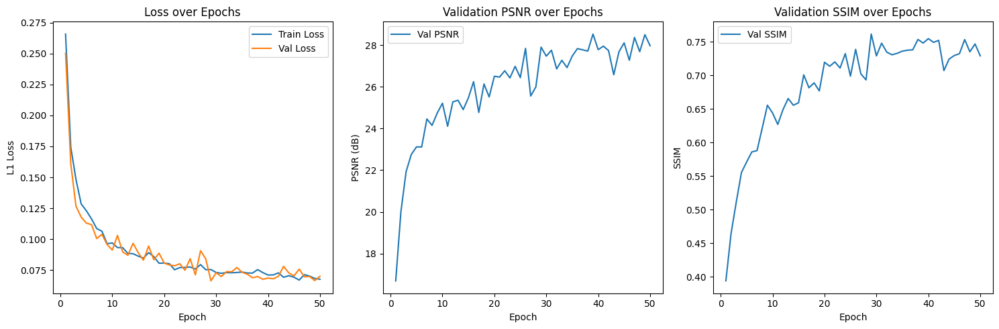

In [22]:
# load history
with open(os.path.join(save_dir, 'kaggle_option_training_history.pkl'), 'rb') as f:history = pickle.load(f)

train_losses = history['train_losses']
val_losses = history['val_losses']
val_psnrs = history['val_psnrs']
val_ssims = history['val_ssims']
val_fids = history['val_fids']

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(15, 5))

# Loss
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Val Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('L1 Loss')
plt.legend()

# PSNR
plt.subplot(1, 3, 2)
plt.plot(epochs_range, val_psnrs, label='Val PSNR')
plt.title('Validation PSNR over Epochs')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.legend()

# SSIM
plt.subplot(1, 3, 3)
plt.plot(epochs_range, val_ssims, label='Val SSIM')
plt.title('Validation SSIM over Epochs')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.legend()

plt.tight_layout()
plt.show()

# Results

<ipython-input-19-424745090>:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  imr_pred = model(torch.tensor(img_lr).unsqueeze(0).to(device))


Text(0.5, 1.0, 'Predicted image')

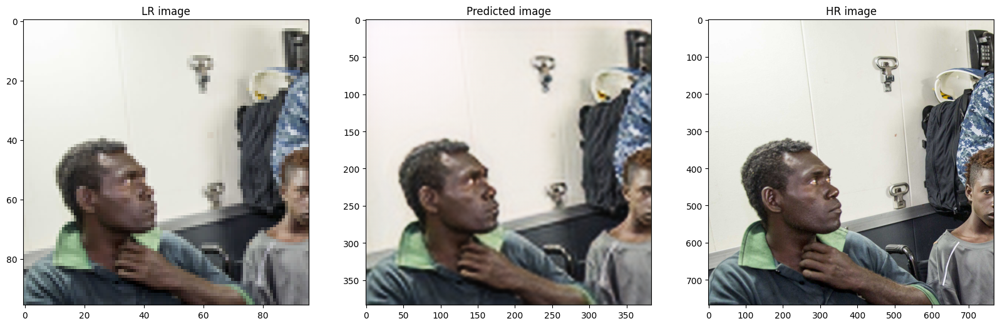

In [19]:
crop_size = 8*96  # crop size of target HR images
scaling_factor = 8
train_dataset = SRDataset('./',
                          split='valid',
                          crop_size=crop_size,
                          scaling_factor=scaling_factor,
                          lr_img_type='[-1, 1]',
                          hr_img_type='[-1, 1]')
img_lr, img_hr = train_dataset[12]
plt.figure(figsize=(20,20))
plt.subplot(131)
plt.imshow((img_lr.swapaxes(0,1).swapaxes(1,2) + 1) * 0.5)
plt.title('LR image')
plt.subplot(133)
plt.imshow((img_hr.swapaxes(0,1).swapaxes(1,2) + 1) * 0.5)
plt.title('HR image')


checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model']
imr_pred = model(torch.tensor(img_lr).unsqueeze(0).to(device))

plt.subplot(132)
plt.imshow((imr_pred.detach().cpu().squeeze().numpy().swapaxes(0,1).swapaxes(1,2) + 1) * 0.5)
plt.title('Predicted image')

# Apply the results to some image

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

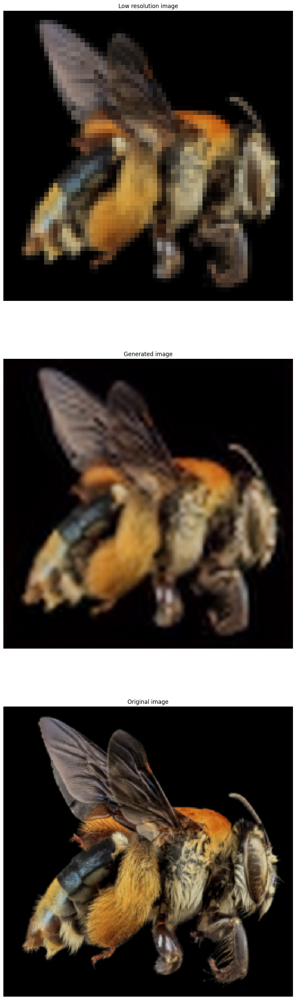

In [ ]:

img_lr = resize(img,(int(img.shape[0]/4), int(img.shape[1]/4)))
plt.figure(figsize=(15,38))
plt.subplot(311)
plt.imshow(img_lr)
plt.title('Low resolution image')
plt.axis('off')

plt.subplot(313)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model']
imr_pred = model(torch.tensor(img_lr).swapaxes(1,2).swapaxes(0,1).unsqueeze(0).to(device).float())

plt.subplot(312)
plt.imshow(imr_pred.detach().cpu().squeeze().numpy().swapaxes(0,1).swapaxes(1,2))
plt.title('Generated image')
plt.axis('off')

# plt.savefig('earth.png', dpi=300, bbox_inches='tight')

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

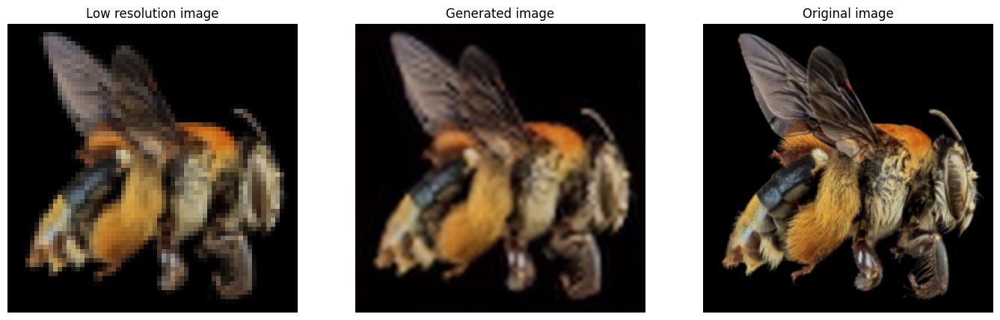

In [ ]:
img_lr = resize(img,(int(img.shape[0]/4), int(img.shape[1]/4)))
plt.figure(figsize=(17,10))
plt.subplot(131)
plt.imshow(img_lr)
plt.title('Low resolution image')
plt.axis('off')

plt.subplot(133)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

#checkpoint = torch.load('./checkpoint_srresnet.pth.tar', weights_only=False)
checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model']
imr_pred = model(torch.tensor(img_lr).swapaxes(1,2).swapaxes(0,1).unsqueeze(0).to(device).float())

plt.subplot(132)
plt.imshow(imr_pred.detach().cpu().squeeze().numpy().swapaxes(0,1).swapaxes(1,2))
plt.title('Generated image')
plt.axis('off')

## Selecting any image to show later low resolution and high resolution:

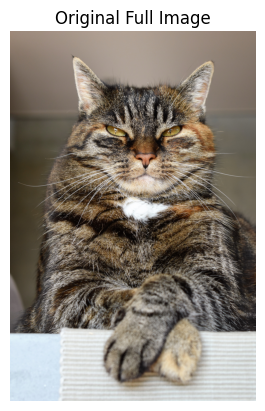

In [ ]:
# Set path to HR images
hr_path = '/content/DIV2K_valid_HR/DIV2K_valid_HR'
filename = sorted(os.listdir(hr_path))[68]
img_path = os.path.join(hr_path, filename)

# Load and display the image
original_img = imread(img_path)
plt.imshow(original_img)
plt.title('Original Full Image')
plt.axis('off')
plt.show()


## Original image with Original resolution, Original image Low resolution, Original image Prediction

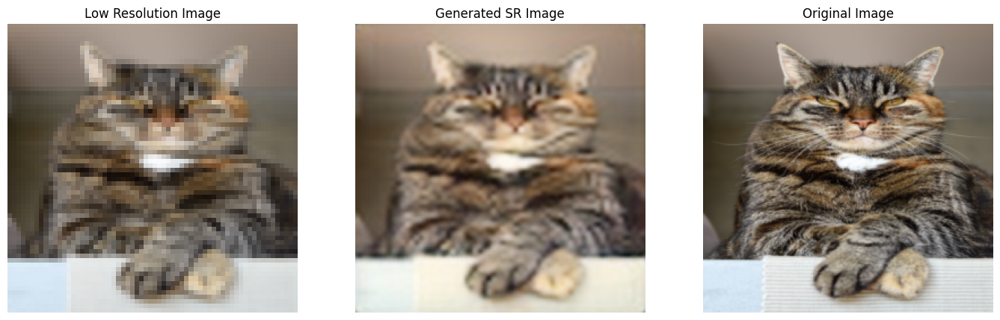

In [ ]:

# Set the path to the image folder
path = '/content/DIV2K_valid_HR/DIV2K_valid_HR'

# Load only the first image in the folder
first_file = sorted(os.listdir(path))[68]
img_path = os.path.join(path, first_file)

# Read the image and reduce it to 256x256
img = resize(imread(img_path), (256, 256))

# Create a low resolution version (x4 downsample)
img_lr = resize(img, (img.shape[0] // 4, img.shape[1] // 4))

# Load the model
checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model'].to(device)
model.eval()

# Convert the image to a suitable input for the model
img_lr_tensor = torch.tensor(img_lr).permute(2, 0, 1).unsqueeze(0).float().to(device)

# Running the model
with torch.no_grad():
    sr_pred = model(img_lr_tensor)

# plot
plt.figure(figsize=(17, 10))

plt.subplot(131)
plt.imshow(img_lr)
plt.title('Low Resolution Image')
plt.axis('off')


plt.subplot(132)
sr_img_np = sr_pred.squeeze().cpu().numpy().transpose(1, 2, 0)
sr_img_np = (sr_img_np - sr_img_np.min()) / (sr_img_np.max() - sr_img_np.min())  # Normalize to [0,1] for display
plt.imshow(sr_img_np)
plt.title('Generated SR Image')
plt.axis('off')

plt.subplot(133)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.show()

## Showing low resolution and high resolution for a crop taken randomly from the image

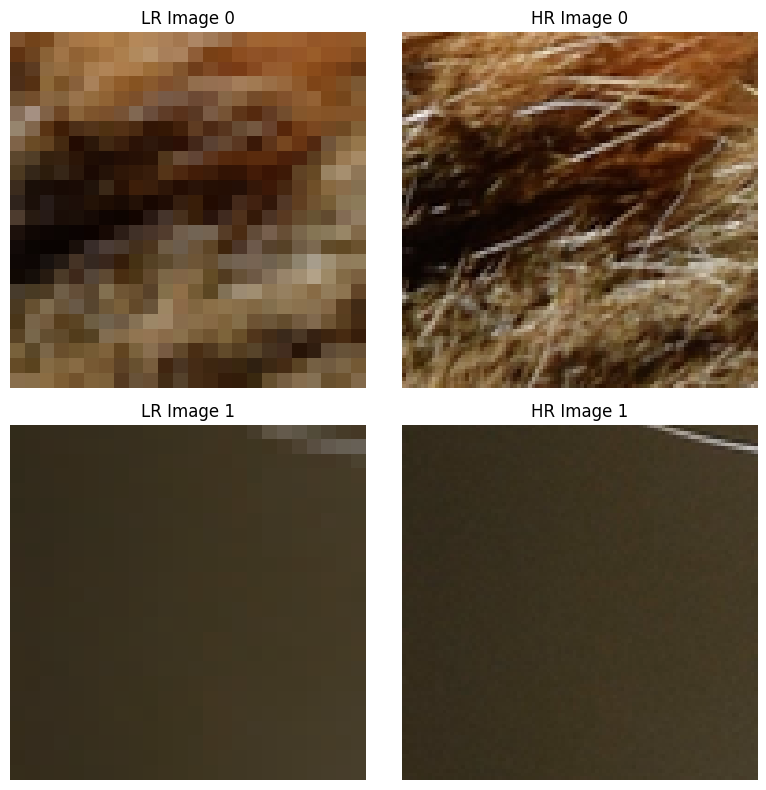

In [ ]:

# Load the data
dataset = SRDataset(data_folder='./', split='valid', crop_size=96, scaling_factor=4, lr_img_type='[-1, 1]', hr_img_type='[-1, 1]')

# Show some pictures
def show_sample_images(dataset, num_samples=2):
    fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4 * num_samples))
    to_pil = transforms.ToPILImage()

    for i in range(num_samples):
        lr_img, hr_img = dataset[68]
        lr_img = ((lr_img + 1) / 2).clamp(0, 1)
        hr_img = ((hr_img + 1) / 2).clamp(0, 1)

        lr_img_pil = to_pil(lr_img)
        hr_img_pil = to_pil(hr_img)

        axes[i, 0].imshow(lr_img_pil)
        axes[i, 0].set_title(f'LR Image {i}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(hr_img_pil)
        axes[i, 1].set_title(f'HR Image {i}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

show_sample_images(dataset)


 ## Diagram illustrating the model

In [ ]:
!pip install torchviz

In [ ]:
import torch
from torchviz import make_dot

# Let's assume all your classes are already defined here: SRResNet, ResidualBlock, ConvolutionalBlock, etc.

# Create an instance of your model
model = SRResNet(scaling_factor=4)

# Create a fake input (Fake Input)
x = torch.randn(1, 3, 24, 24)  # Small 24x24 image with 3 channels

# Run the model
output = model(x)

# Create a graph
dot = make_dot(output, params=dict(model.named_parameters()))

# Save the graph as a PNG file
dot.format = "png"
dot.directory = "graphs"
dot.render("srresnet_architecture")


'graphs/srresnet_architecture.png'

In [ ]:
from IPython.display import Image
Image("graphs/srresnet_architecture.png")


##3.4.1.4) Crop qualitative examples

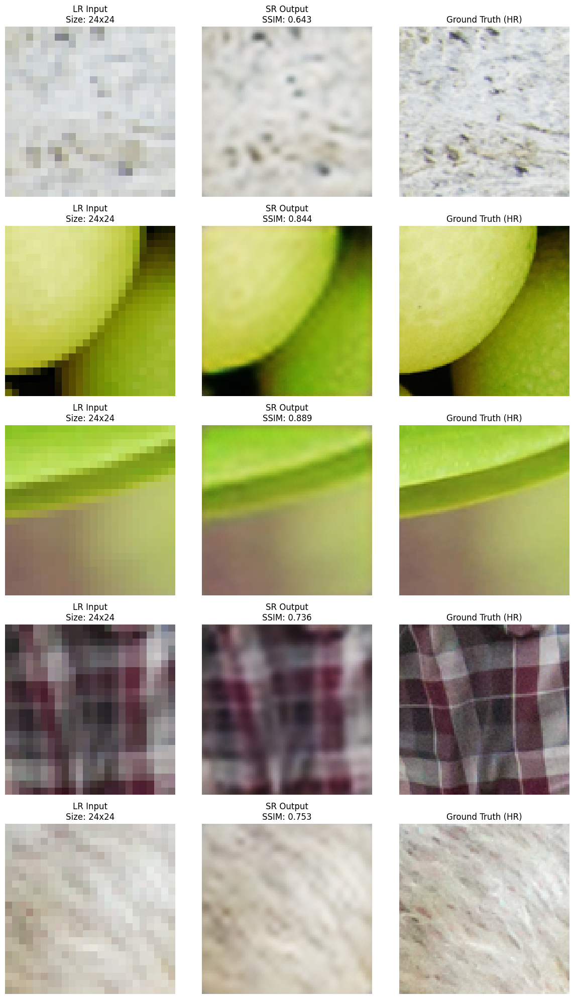

In [ ]:
def show_sr_examples(model, dataset, device, num_examples=4):

    model.eval()
    to_pil = transforms.ToPILImage()

    fig, axes = plt.subplots(num_examples, 3, figsize=(12, 4 * num_examples))

    for i in range(num_examples):
        lr_img, hr_img = dataset[i]

        # Save to original input
        lr_input = lr_img.unsqueeze(0).to(device)  # (1, 3, H, W)

        with torch.no_grad():
            sr_img = model(lr_input)

        # Return to range [0, 1]
        lr_img_disp = ((lr_img + 1) / 2).clamp(0, 1).cpu()
        sr_img_disp = ((sr_img.squeeze(0) + 1) / 2).clamp(0, 1).cpu()
        hr_img_disp = ((hr_img + 1) / 2).clamp(0, 1).cpu()

        # Convert to numpy
        lr_np = np.array(to_pil(lr_img_disp))
        sr_np = np.array(to_pil(sr_img_disp))
        hr_np = np.array(to_pil(hr_img_disp))

        # SSIM calculation between SR and HR
        ssim_val = compare_ssim(hr_np, sr_np, channel_axis=2)

        # plot
        axes[i, 0].imshow(lr_np)
        axes[i, 0].set_title(f"LR Input\nSize: {lr_np.shape[1]}x{lr_np.shape[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sr_np)
        axes[i, 1].set_title(f"SR Output\nSSIM: {ssim_val:.3f}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(hr_np)
        axes[i, 2].set_title("Ground Truth (HR)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Load the model
checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model'].to(device)

dataset = SRDataset(data_folder='./', split='valid', crop_size=96, scaling_factor=4, lr_img_type='[-1, 1]', hr_img_type='[-1, 1]')
show_sr_examples(model, dataset, device, num_examples=5)

##3.4.1.4) Qualitative examples showing both successful and failed predictions

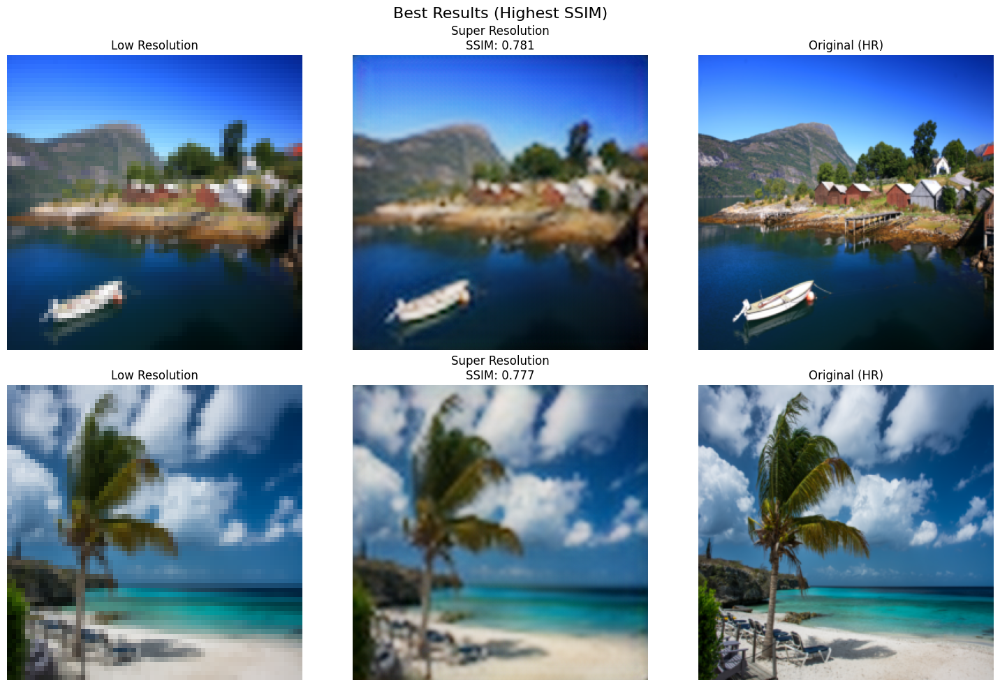

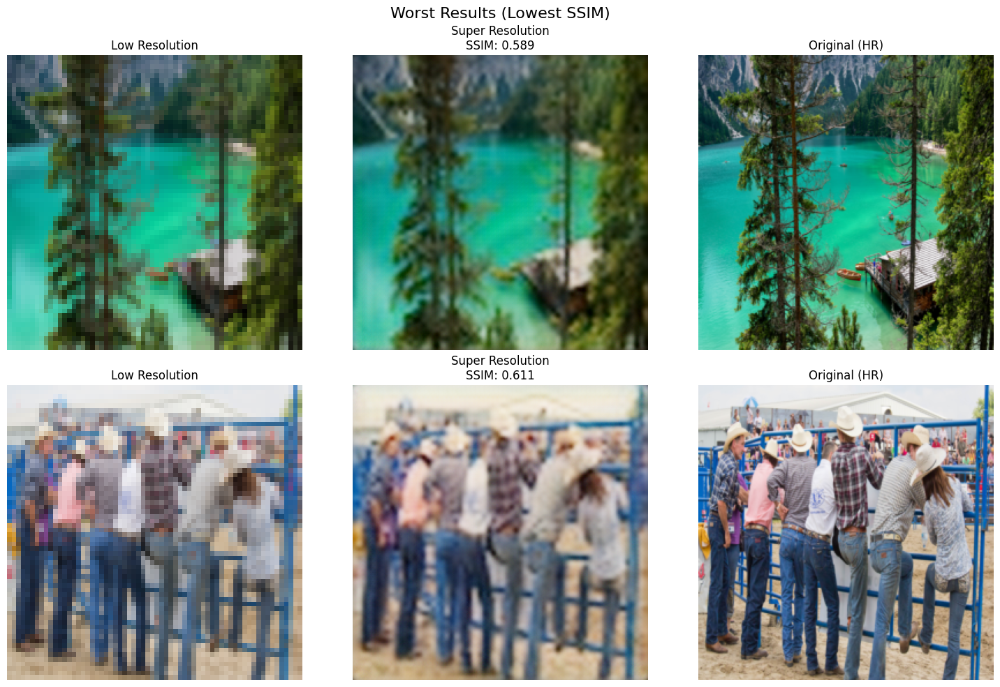

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from skimage.metrics import structural_similarity as compare_ssim

# Set the path to the image folder
path = '/content/DIV2K_valid_HR/DIV2K_valid_HR'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the model
checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
checkpoint = torch.load(checkpoint_path, weights_only=False)
model = checkpoint['model'].to(device)
model.eval()

results = []

# We will go through only a few images for example
for file in sorted(os.listdir(path))[:10]:
    img_path = os.path.join(path, file)
    img = imread(img_path)

    # Resize to 256x256 for uniformity
    img = resize(img, (256, 256), preserve_range=True) / 255.0

    # Reduce the image by 4 times
    img_lr = resize(img, (64, 64), preserve_range=True)

    # Convert to tensor and pass to device
    img_lr_tensor = torch.tensor(img_lr).permute(2, 0, 1).unsqueeze(0).float().to(device)

    # run model
    with torch.no_grad():
        sr_pred = model(img_lr_tensor)

    # Rendering for display
    sr_img = sr_pred.squeeze().cpu().numpy().transpose(1, 2, 0)
    sr_img = np.clip(sr_img, 0, 1)

    # Calculate SSIM between SR and the original image
    ssim_val = compare_ssim(img, sr_img, channel_axis=2, data_range=1.0)

    results.append({
        'ssim': ssim_val,
        'lr': img_lr,
        'sr': sr_img,
        'hr': img
    })

# Sort by SSIM
results.sort(key=lambda x: x['ssim'])

# Take 2 bad and 2 good
worst = results[:2]
best = results[-2:][::-1]

# plot
def plot_comparison(samples, title):
    fig, axes = plt.subplots(len(samples), 3, figsize=(15, 5 * len(samples)))
    for i, sample in enumerate(samples):
        axes[i, 0].imshow(sample['lr'])
        axes[i, 0].set_title("Low Resolution")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sample['sr'])
        axes[i, 1].set_title(f"Super Resolution\nSSIM: {sample['ssim']:.3f}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(sample['hr'])
        axes[i, 2].set_title("Original (HR)")
        axes[i, 2].axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

plot_comparison(best, "Best Results (Highest SSIM)")
plot_comparison(worst, "Worst Results (Lowest SSIM)")


# 3.5) OUR MODEL



## 3.5.3) Data Loading and Preprocessing Pipeline Classes

In [ ]:
def normalize(img):
    img = np.array(img).astype(np.float32) / 255.0
    img = np.transpose(img, (2, 0, 1))  # HWC to CHW
    return torch.from_numpy(img)

class MyModelDataset(Dataset):
    def __init__(self, data_folder, split, crop_size=96, scale=4):
        self.data_folder = data_folder
        self.crop_size = crop_size
        self.scale = scale
        self.split=split
        if self.split == 'train':
            assert self.crop_size % self.scale == 0, "Crop dimensions are not perfectly divisible by scaling factor! This will lead to a mismatch in the dimensions of the original HR patches and their super-resolved (SR) versions!"

        # Read list of image-paths
        if self.split == 'train':
            path = os.path.join(data_folder, 'DIV2K_train_HR','DIV2K_train_HR')
        else:
            path = os.path.join(data_folder, 'DIV2K_valid_HR', 'DIV2K_valid_HR')

        self.hr_images = sorted([
            os.path.join(path, x) for x in os.listdir(path) if x.endswith('.png')
        ])

    def __len__(self):
        return len(self.hr_images)

    def __getitem__(self, i):

        # Read image
        img = Image.open(self.hr_images[i], mode='r')
        hr_image = img.convert('RGB')
        # Random crop from HR image
        x = np.random.randint(0, hr_image.width - self.crop_size + 1)
        y = np.random.randint(0, hr_image.height - self.crop_size + 1)
        hr_crop = hr_image.crop((x, y, x + self.crop_size, y + self.crop_size))

        # Downscale to LR using bicubic
        lr_crop = hr_crop.resize((self.crop_size // self.scale, self.crop_size // self.scale), Image.BICUBIC)

        return normalize(lr_crop), normalize(hr_crop)


# Our model structure and architecture

In [ ]:
# --- Residual Block ---
class MyModelResidualBlock(nn.Module):
    def __init__(self, in_channels=256, out_channels=256, kernel_size=3, res_scale=0.1, bias=True):
        super(MyModelResidualBlock, self).__init__()
        self.body = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, padding=1, bias=bias),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels, out_channels, kernel_size, padding=1, bias=bias)
        )
        self.res_scale = res_scale

    def forward(self, input):
        res = self.body(input)
        return res + input

'''# --- UpscaleBlock ---
class SubpixelConvolutionalBlocks(nn.Sequential):
    def __init__(self, scale, n_channels=256):
        layers = []
        if scale in [2, 4]:
            for _ in range(int(np.log2(scale))):
                layers += [
                    nn.Conv2d(n_channels, n_channels * 4, kernel_size=3, stride=1, padding=1),
                    nn.PixelShuffle(scale)
                ]'''

class SubPixelConvolutionalBlock(nn.Module):
    def __init__(self, kernel_size=3, n_channels=256, scaling_factor=2):
        super(SubPixelConvolutionalBlock, self).__init__()
        self.conv = nn.Conv2d(
            in_channels=n_channels,
            out_channels=n_channels * (scaling_factor ** 2),
            kernel_size=kernel_size,
            padding=1
        )
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor=scaling_factor)

    def forward(self, input):
        input = self.conv(input)
        input = self.pixel_shuffle(input)
        return input

class SubPixelConvBlocks(nn.Module):
    """
    A sequence of subpixel convolutional blocks to upscale the input image by the given scale factor.
    Each block upsamples by a factor of 2 (or 3 if specified).
    """

    def __init__(self, scale, n_channels=256, kernel_size=3):
        """
        :param scale: Total upscaling factor (2, 3, 4, etc.)
        :param n_channels: Number of input/output channels
        :param kernel_size: Convolution kernel size
        """
        super(SubPixelConvBlocks, self).__init__()

        blocks = []
        if scale in [2, 4]:
            for _ in range(int(np.log2(scale))):
                blocks.append(SubPixelConvolutionalBlock(
                    kernel_size=kernel_size,
                    n_channels=n_channels,
                    scaling_factor=2
                ))

        self.blocks = nn.Sequential(*blocks)

    def forward(self, input):
        return self.blocks(input)

# --- NormAndDeNorm (for normalization and denormalization) ---
class NormAndDeNorm(nn.Conv2d):
    def __init__(self, rgb_range=1.0, rgb_mean=(0.4488, 0.4371, 0.4040),
                 rgb_std=(1.0, 1.0, 1.0), sign=-1):
        super(NormAndDeNorm, self).__init__(3, 3, kernel_size=1)
        std = torch.Tensor(rgb_std)
        self.weight.data = torch.eye(3).view(3, 3, 1, 1) / std.view(3, 1, 1, 1)
        self.bias.data = sign * rgb_range * torch.Tensor(rgb_mean) / std
        for p in self.parameters():
            p.requires_grad = False

# --- Full Our EDSR Model ---
class MyEDSRNNModel(nn.Module):
    def __init__(self, n_resblocks, n_channels, res_scale, scale):
        super(MyEDSRNNModel, self).__init__()

        self.sub_mean = NormAndDeNorm(rgb_range=1.0, sign=-1)
        self.add_mean = NormAndDeNorm(rgb_range=1.0, sign=1)

        # output of first conv layer of our model
        RGB=3
        self.conv_block1 = nn.Conv2d(RGB, n_channels, kernel_size=3, padding=1)

        # Body
        # Residual blocks (רק הבלוקים עצמם)
        self.residual_blocks = nn.Sequential(
            *[MyModelResidualBlock(in_channels=n_channels, out_channels=n_channels, res_scale=res_scale) for _ in range(n_resblocks)]
        )

        # Conv אחרי הבלוקים
        self.conv_block2 = nn.Conv2d(n_channels, n_channels, kernel_size=3, padding=1)

        # Upsampling block (PixelShuffle + Conv)
        self.subpixel_convolutional_blocks = SubPixelConvBlocks(scale, n_channels)

        # Final convolution layer to map to RGB
        self.conv_block3 = nn.Conv2d(n_channels, 3, kernel_size=3, padding=1)

    def forward(self, lr_imgs):
        lr_imgs_Norm = self.sub_mean(lr_imgs)
        output = self.conv_block1(lr_imgs_Norm)
        residual = output
        output = self.residual_blocks(output)
        output = self.conv_block2(output)  # (N, n_channels, w, h)
        output = residual + output
        output = self.subpixel_convolutional_blocks(output)
        output = self.conv_block3(output)
        sr_imgs = self.add_mean(output)
        return sr_imgs

## Data Loading and Preprocessing Pipeline Execution

In [ ]:
from torch.utils.data import random_split, DataLoader

# our-specific model params
scale = 4
crop_size = 96
batch_size = 32  #
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_resblocks = 32
n_channels = 256
#self.res_scale = 0.1

# 1. Dataset
train_dataset = MyModelDataset(data_folder='./', split = 'train', crop_size=96, scale=4)
val_dataset = MyModelDataset(data_folder='./', split= 'valid', crop_size=96, scale=4)

# 3. DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

# 4. Model
model = MyEDSRNNModel(n_resblocks, n_channels, 0.1, scale)
model = model.to(device)


# Train and Valid Our Model

In [ ]:

lr = 1e-4
epochs = 50

def train_one_epoch(epoch, criterion, optimizer):
    model.train()
    running_loss = 0.0
    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{epochs}]")
    for lr, hr in loop:
        lr, hr = lr.to(device), hr.to(device)
        sr = model(lr)
        loss = criterion(sr, hr)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())
    return running_loss / len(train_loader)

def validate_one_epoch(criterion):
    model.eval()
    total_psnr = 0.0
    total_ssim = 0.0
    total_loss = 0.0
    num_images = 0

    # Temporary folders for FID
    temp_real_dir = tempfile.mkdtemp()
    temp_fake_dir = tempfile.mkdtemp()

    to_pil = transforms.ToPILImage()

    with torch.no_grad():
        for i, (lr, hr) in enumerate(val_loader):
            lr, hr = lr.to(device), hr.to(device)
            sr = model(lr)

            # חישוב L1 loss
            loss = criterion(sr, hr)
            total_loss += loss.item()

            # שיחזור טווח מ [-1, 1] ל [0, 1]
            sr_imgs_clamped = ((sr + 1) / 2).clamp(0, 1).cpu()
            hr_imgs_clamped = ((hr + 1) / 2).clamp(0, 1).cpu()

            for idx in range(sr.size(0)):
                sr_img = to_pil(sr_imgs_clamped[idx])
                hr_img = to_pil(hr_imgs_clamped[idx])

                sr_np = np.array(sr_img)
                hr_np = np.array(hr_img)

                total_psnr += compare_psnr(hr_np, sr_np, data_range=255)
                total_ssim += compare_ssim(hr_np, sr_np, channel_axis=2)
                num_images += 1

                # Save for FID
                sr_img.save(os.path.join(temp_fake_dir, f"{i}_{idx}_fake.png"))
                hr_img.save(os.path.join(temp_real_dir, f"{i}_{idx}_real.png"))

    avg_psnr = total_psnr / num_images
    avg_ssim = total_ssim / num_images
    avg_loss = total_loss / len(val_loader)

    fid = fid_score.calculate_fid_given_paths([temp_real_dir, temp_fake_dir],
                                              batch_size=50,
                                              device=device,
                                              dims=2048)

    shutil.rmtree(temp_real_dir)
    shutil.rmtree(temp_fake_dir)

    return avg_loss, avg_psnr, avg_ssim, fid


def train_model_func(criterion, modelType=1):
      optimizer = optim.Adam(model.parameters(), lr=lr)

      # Learning rate scheduler
      scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
      print("No checkpoint found. Starting training from scratch.")
      metrics_df = pd.DataFrame({
          'Epoch': pd.Series(dtype='int'),
          'PSNR': pd.Series(dtype='float'),
          'SSIM': pd.Series(dtype='float'),
          'FID': pd.Series(dtype='float'),
      })
      train_losses = []
      val_losses = []
      val_psnrs = []
      val_ssims = []
      val_fids = []
      # Training loop
      best_val_psnr = 0.0
      best_valid_loss = 0.0
      for epoch in range(epochs):
          train_loss = train_one_epoch(epoch, criterion, optimizer)
          avg_loss, val_psnr, val_ssim, val_fid = validate_one_epoch(criterion)

          if epoch%10==0 or epoch==49:
                new_row = {'Epoch': epoch, 'PSNR': val_psnr, 'SSIM': val_ssim, 'FID': val_fid}
                if not metrics_df.empty:
                    metrics_df = pd.concat([metrics_df, pd.DataFrame([new_row])], ignore_index=True)
                else:
                    metrics_df = pd.DataFrame([new_row])

          if epoch==49:
                print(metrics_df)

          train_losses.append(train_loss)
          val_losses.append(avg_loss)
          val_psnrs.append(val_psnr)
          val_ssims.append(val_ssim)
          val_fids.append(val_fid)

          print(f"Training Loss: {train_loss:.4f}, Validation Loss: {avg_loss:.4f}")
          print(f"Epoch {epoch+1} -- PSNR: {val_psnr:.2f}, SSIM: {val_ssim:.4f}, FID: {val_fid:.2f}")

          if scheduler:
              scheduler.step()

          # Save best model
          # Simple normalization of PSNR (around 20–30) and loss (say around 0.01–0.1)
          norm_psnr = val_psnr / 35  # Normalize to [0,1]
          norm_loss = 1 - min(avg_loss / 0.1, 1.0)  # The smaller the loss, the better

          # Weighting – we can play with the weights according to importance
          score = 0.6 * norm_psnr + 0.4 * norm_loss
          best_score = 0.6 * (best_val_psnr / 35) + 0.4 * (1 - min(best_valid_loss / 0.1, 1.0))

          if score > best_score:
              os.makedirs(save_dir, exist_ok=True)
              if modelType==1:
                 save_path = os.path.join(save_dir, "my_best_model.pth")
              else:
                 save_path = os.path.join(save_dir, "my_best_ablated_versions_model.pth")
              best_val_psnr = val_psnr
              best_valid_loss = avg_loss
              torch.save(model.state_dict(), save_path)
              print(f"New best model saved with PSNR: {val_psnr:.2f} dB and loss: {avg_loss:.4f}")
      history = {
                  'train_losses': train_losses,
                  'val_losses': val_losses,
                  'val_psnrs': val_psnrs,
                  'val_ssims': val_ssims,
                  'val_fids': val_fids
                    }
      if modelType==1:
          metrics_df.to_csv(os.path.join(save_dir, 'my_model_training_metrics.csv'), index=False)
      else:
          metrics_df.to_csv(os.path.join(save_dir, 'my_ablated_model_training_metrics.csv'), index=False)

      return history

checkpoint_path = os.path.join(save_dir, "my_best_model.pth")
if os.path.exists(checkpoint_path):
    print("Checkpoint found. Loading model and skipping training.")
    model.load_state_dict(torch.load(checkpoint_path, weights_only=False))
    model.to(device)
else:
    history = train_model_func(criterion=nn.L1Loss())


No checkpoint found. Starting training from scratch.


Epoch [1/50]: 100%|██████████| 25/25 [01:13<00:00,  2.93s/it, loss=0.0701]
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 355MB/s]
100%|██████████| 2/2 [00:00<00:00,  3.78it/s]


Training Loss: 0.1342, Validation Loss: 0.0668
Epoch 1 -- PSNR: 27.35, SSIM: 0.6848, FID: 301.78
New best model saved with PSNR: 27.35 dB and loss: 0.0668


100%|██████████| 2/2 [00:00<00:00,  4.06it/s]


Training Loss: 0.0555, Validation Loss: 0.0510
Epoch 2 -- PSNR: 29.39, SSIM: 0.7473, FID: 276.87
New best model saved with PSNR: 29.39 dB and loss: 0.0510


100%|██████████| 2/2 [00:00<00:00,  3.77it/s]


Training Loss: 0.0456, Validation Loss: 0.0396
Epoch 3 -- PSNR: 31.56, SSIM: 0.8105, FID: 268.10
New best model saved with PSNR: 31.56 dB and loss: 0.0396


100%|██████████| 2/2 [00:00<00:00,  4.08it/s]


Training Loss: 0.0401, Validation Loss: 0.0382
Epoch 4 -- PSNR: 32.18, SSIM: 0.8270, FID: 244.67
New best model saved with PSNR: 32.18 dB and loss: 0.0382


100%|██████████| 2/2 [00:00<00:00,  4.10it/s]


Training Loss: 0.0386, Validation Loss: 0.0360
Epoch 5 -- PSNR: 33.29, SSIM: 0.8450, FID: 207.23
New best model saved with PSNR: 33.29 dB and loss: 0.0360


100%|██████████| 2/2 [00:00<00:00,  4.11it/s]


Training Loss: 0.0370, Validation Loss: 0.0385
Epoch 6 -- PSNR: 33.13, SSIM: 0.8408, FID: 196.41


100%|██████████| 2/2 [00:00<00:00,  3.61it/s]


Training Loss: 0.0359, Validation Loss: 0.0332
Epoch 7 -- PSNR: 33.19, SSIM: 0.8363, FID: 191.53
New best model saved with PSNR: 33.19 dB and loss: 0.0332


100%|██████████| 2/2 [00:00<00:00,  4.11it/s]


Training Loss: 0.0355, Validation Loss: 0.0344
Epoch 8 -- PSNR: 33.35, SSIM: 0.8453, FID: 194.75


100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Training Loss: 0.0351, Validation Loss: 0.0350
Epoch 9 -- PSNR: 33.48, SSIM: 0.8358, FID: 186.00


100%|██████████| 2/2 [00:00<00:00,  3.95it/s]


Training Loss: 0.0340, Validation Loss: 0.0370
Epoch 10 -- PSNR: 33.47, SSIM: 0.8345, FID: 181.66


100%|██████████| 2/2 [00:00<00:00,  4.08it/s]


Training Loss: 0.0300, Validation Loss: 0.0318
Epoch 11 -- PSNR: 34.51, SSIM: 0.8450, FID: 182.51
New best model saved with PSNR: 34.51 dB and loss: 0.0318


100%|██████████| 2/2 [00:00<00:00,  3.62it/s]


Training Loss: 0.0310, Validation Loss: 0.0319
Epoch 12 -- PSNR: 34.52, SSIM: 0.8493, FID: 171.95


100%|██████████| 2/2 [00:00<00:00,  4.06it/s]


Training Loss: 0.0310, Validation Loss: 0.0335
Epoch 13 -- PSNR: 34.37, SSIM: 0.8490, FID: 175.57


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Training Loss: 0.0309, Validation Loss: 0.0313
Epoch 14 -- PSNR: 34.62, SSIM: 0.8479, FID: 175.90
New best model saved with PSNR: 34.62 dB and loss: 0.0313


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Training Loss: 0.0303, Validation Loss: 0.0331
Epoch 15 -- PSNR: 33.83, SSIM: 0.8368, FID: 180.94


100%|██████████| 2/2 [00:00<00:00,  3.58it/s]


Training Loss: 0.0305, Validation Loss: 0.0338
Epoch 16 -- PSNR: 34.24, SSIM: 0.8500, FID: 182.36


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0316, Validation Loss: 0.0324
Epoch 17 -- PSNR: 35.45, SSIM: 0.8619, FID: 169.89
New best model saved with PSNR: 35.45 dB and loss: 0.0324


100%|██████████| 2/2 [00:00<00:00,  3.96it/s]


Training Loss: 0.0319, Validation Loss: 0.0298
Epoch 18 -- PSNR: 35.25, SSIM: 0.8565, FID: 169.49
New best model saved with PSNR: 35.25 dB and loss: 0.0298


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0307, Validation Loss: 0.0295
Epoch 19 -- PSNR: 34.98, SSIM: 0.8535, FID: 169.66


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Training Loss: 0.0299, Validation Loss: 0.0304
Epoch 20 -- PSNR: 35.60, SSIM: 0.8632, FID: 160.41
New best model saved with PSNR: 35.60 dB and loss: 0.0304


100%|██████████| 2/2 [00:00<00:00,  3.51it/s]


Training Loss: 0.0306, Validation Loss: 0.0326
Epoch 21 -- PSNR: 35.32, SSIM: 0.8570, FID: 169.54


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Training Loss: 0.0308, Validation Loss: 0.0351
Epoch 22 -- PSNR: 35.13, SSIM: 0.8524, FID: 169.98


100%|██████████| 2/2 [00:00<00:00,  3.96it/s]


Training Loss: 0.0291, Validation Loss: 0.0269
Epoch 23 -- PSNR: 36.85, SSIM: 0.8753, FID: 156.24
New best model saved with PSNR: 36.85 dB and loss: 0.0269


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0298, Validation Loss: 0.0287
Epoch 24 -- PSNR: 35.72, SSIM: 0.8644, FID: 170.80


100%|██████████| 2/2 [00:00<00:00,  3.57it/s]


Training Loss: 0.0306, Validation Loss: 0.0284
Epoch 25 -- PSNR: 35.97, SSIM: 0.8594, FID: 155.74


100%|██████████| 2/2 [00:00<00:00,  3.94it/s]


Training Loss: 0.0299, Validation Loss: 0.0282
Epoch 26 -- PSNR: 35.71, SSIM: 0.8635, FID: 176.09


100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


Training Loss: 0.0296, Validation Loss: 0.0305
Epoch 27 -- PSNR: 35.12, SSIM: 0.8518, FID: 177.45


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Training Loss: 0.0294, Validation Loss: 0.0325
Epoch 28 -- PSNR: 35.45, SSIM: 0.8505, FID: 164.87


100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


Training Loss: 0.0281, Validation Loss: 0.0296
Epoch 29 -- PSNR: 35.33, SSIM: 0.8544, FID: 162.05


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Training Loss: 0.0294, Validation Loss: 0.0284
Epoch 30 -- PSNR: 35.28, SSIM: 0.8480, FID: 175.17


100%|██████████| 2/2 [00:00<00:00,  3.87it/s]


Training Loss: 0.0290, Validation Loss: 0.0314
Epoch 31 -- PSNR: 35.29, SSIM: 0.8424, FID: 177.07


100%|██████████| 2/2 [00:00<00:00,  3.81it/s]


Training Loss: 0.0292, Validation Loss: 0.0294
Epoch 32 -- PSNR: 35.57, SSIM: 0.8625, FID: 168.30


100%|██████████| 2/2 [00:00<00:00,  3.81it/s]


Training Loss: 0.0284, Validation Loss: 0.0299
Epoch 33 -- PSNR: 35.67, SSIM: 0.8510, FID: 166.98


100%|██████████| 2/2 [00:00<00:00,  3.89it/s]


Training Loss: 0.0296, Validation Loss: 0.0256
Epoch 34 -- PSNR: 37.19, SSIM: 0.8729, FID: 149.92
New best model saved with PSNR: 37.19 dB and loss: 0.0256


100%|██████████| 2/2 [00:00<00:00,  3.89it/s]


Training Loss: 0.0290, Validation Loss: 0.0318
Epoch 35 -- PSNR: 36.51, SSIM: 0.8561, FID: 156.18


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


Training Loss: 0.0284, Validation Loss: 0.0305
Epoch 36 -- PSNR: 35.03, SSIM: 0.8365, FID: 173.67


100%|██████████| 2/2 [00:00<00:00,  3.79it/s]


Training Loss: 0.0297, Validation Loss: 0.0317
Epoch 37 -- PSNR: 34.90, SSIM: 0.8473, FID: 168.92


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0296, Validation Loss: 0.0274
Epoch 38 -- PSNR: 36.14, SSIM: 0.8627, FID: 167.06


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Training Loss: 0.0287, Validation Loss: 0.0293
Epoch 39 -- PSNR: 35.81, SSIM: 0.8633, FID: 162.28


100%|██████████| 2/2 [00:00<00:00,  3.50it/s]


Training Loss: 0.0291, Validation Loss: 0.0293
Epoch 40 -- PSNR: 35.21, SSIM: 0.8515, FID: 173.45


100%|██████████| 2/2 [00:00<00:00,  3.92it/s]


Training Loss: 0.0293, Validation Loss: 0.0334
Epoch 41 -- PSNR: 35.31, SSIM: 0.8538, FID: 173.79


100%|██████████| 2/2 [00:00<00:00,  3.87it/s]


Training Loss: 0.0277, Validation Loss: 0.0271
Epoch 42 -- PSNR: 36.24, SSIM: 0.8600, FID: 152.30


100%|██████████| 2/2 [00:00<00:00,  3.89it/s]


Training Loss: 0.0287, Validation Loss: 0.0294
Epoch 43 -- PSNR: 35.55, SSIM: 0.8563, FID: 166.41


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0285, Validation Loss: 0.0283
Epoch 44 -- PSNR: 36.63, SSIM: 0.8703, FID: 156.50


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0299, Validation Loss: 0.0267
Epoch 45 -- PSNR: 36.30, SSIM: 0.8740, FID: 161.51


100%|██████████| 2/2 [00:00<00:00,  3.32it/s]


Training Loss: 0.0286, Validation Loss: 0.0312
Epoch 46 -- PSNR: 35.16, SSIM: 0.8490, FID: 168.59


100%|██████████| 2/2 [00:00<00:00,  3.85it/s]


Training Loss: 0.0283, Validation Loss: 0.0255
Epoch 47 -- PSNR: 36.80, SSIM: 0.8717, FID: 158.05


100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


Training Loss: 0.0299, Validation Loss: 0.0309
Epoch 48 -- PSNR: 35.41, SSIM: 0.8561, FID: 166.52


100%|██████████| 2/2 [00:00<00:00,  3.95it/s]


Training Loss: 0.0291, Validation Loss: 0.0273
Epoch 49 -- PSNR: 36.51, SSIM: 0.8728, FID: 160.68


100%|██████████| 2/2 [00:00<00:00,  3.85it/s]


   Epoch       PSNR      SSIM         FID
0      0  27.347474  0.684801  301.776321
1     10  34.513281  0.844996  182.514691
2     20  35.321822  0.857047  169.544478
3     30  35.287344  0.842427  177.073004
4     40  35.308998  0.853830  173.787831
5     49  35.812794  0.861978  163.069173
Training Loss: 0.0306, Validation Loss: 0.0321
Epoch 50 -- PSNR: 35.81, SSIM: 0.8620, FID: 163.07


# Save History

In [ ]:
# save to file
with open(os.path.join(save_dir, 'my_model_training_history.pkl'), 'wb') as f:
    pickle.dump(history, f)

print("Training history saved.")


Training history saved.


# 3.5.5) Load and PLOT the loss convergence
#              +
#  3.5.6)PLOT Quantitative metrics


Quantitative metrics table:
   Epoch       PSNR      SSIM         FID
0      0  27.347474  0.684801  301.776321
1     10  34.513281  0.844996  182.514691
2     20  35.321822  0.857047  169.544478
3     30  35.287344  0.842427  177.073004
4     40  35.308998  0.853830  173.787831
5     49  35.812794  0.861978  163.069173
--------------------------------------------------


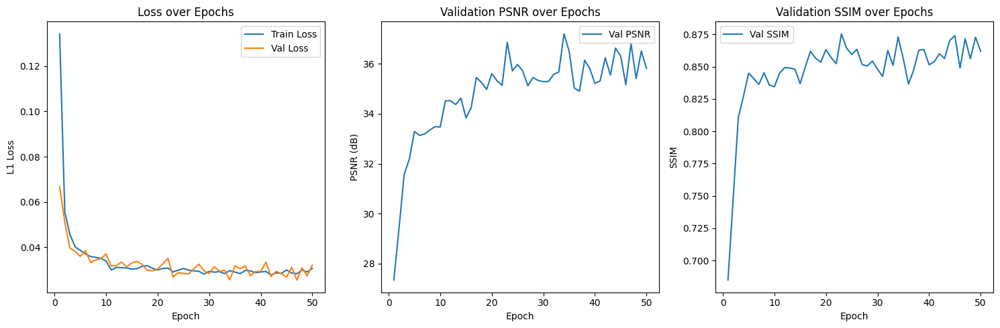

In [ ]:
print("")
csv_path = os.path.join(save_dir, 'my_model_training_metrics.csv')
metrics_df = pd.read_csv(csv_path)
print("Quantitative metrics table:")
print(metrics_df)
print('-'*50)
# Load the saved history
with open(os.path.join(save_dir, 'my_model_training_history.pkl'), 'rb') as f:
    history = pickle.load(f)

train_losses = history['train_losses']
val_losses = history['val_losses']
val_psnrs = history['val_psnrs']
val_ssims = history['val_ssims']
val_fids = history['val_fids']

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(15, 5))

# Loss
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Val Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('L1 Loss')
plt.legend()

# PSNR
plt.subplot(1, 3, 2)
plt.plot(epochs_range, val_psnrs, label='Val PSNR')
plt.title('Validation PSNR over Epochs')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.legend()

# SSIM
plt.subplot(1, 3, 3)
plt.plot(epochs_range, val_ssims, label='Val SSIM')
plt.title('Validation SSIM over Epochs')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.legend()

plt.tight_layout()
plt.show()


# Qualitative Comparison **Crop**: Low-Resolution vs. Super-Resolved vs. Ground Truth

Best model loaded.


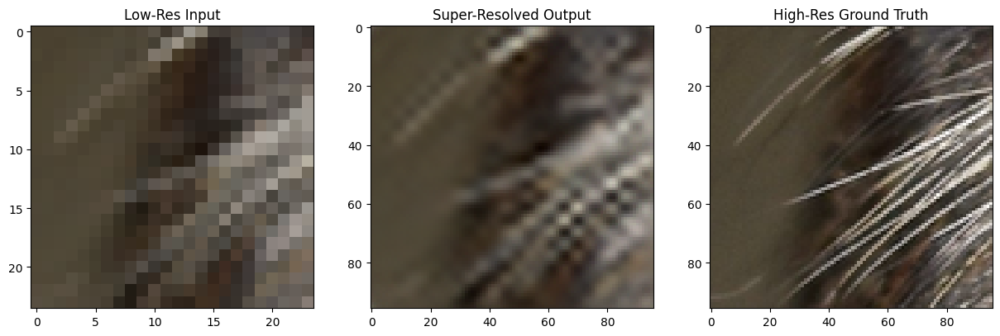

In [ ]:
# Load best model
model = MyEDSRNNModel(n_resblocks, n_channels, 0.1, scale)
model = model.to(device)
get_path = os.path.join(save_dir, "my_best_model.pth")
model.load_state_dict(torch.load(get_path, weights_only=False))
model.eval()
print("Best model loaded.")


# Load one HR test image
test_hr_image = Image.open(val_dataset.hr_images[68])

# Crop a patch and generate LR version
x = np.random.randint(0, test_hr_image.width - crop_size + 1)
y = np.random.randint(0, test_hr_image.height - crop_size + 1)
hr_crop = test_hr_image.crop((x, y, x + crop_size, y + crop_size))
lr_crop = hr_crop.resize((crop_size // scale, crop_size // scale), Image.BICUBIC)

# Convert to tensor and run model
lr_tensor = T.ToTensor()(lr_crop).unsqueeze(0).to(device)  # shape: (1, 3, H, W)
with torch.no_grad():
    sr_tensor = model(lr_tensor).clamp(0.0, 1.0)

# Convert tensors to images for visualization
to_pil = T.ToPILImage()
lr_vis = to_pil(lr_tensor.squeeze(0).cpu())
sr_vis = to_pil(sr_tensor.squeeze(0).cpu())
hr_vis = hr_crop

# Show images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1); plt.imshow(lr_vis); plt.title("Low-Res Input")
plt.subplot(1, 3, 2); plt.imshow(sr_vis); plt.title("Super-Resolved Output")
plt.subplot(1, 3, 3); plt.imshow(hr_vis); plt.title("High-Res Ground Truth")
plt.show()

# Visual Evaluation of the Super-Resolution Model on a Random Image

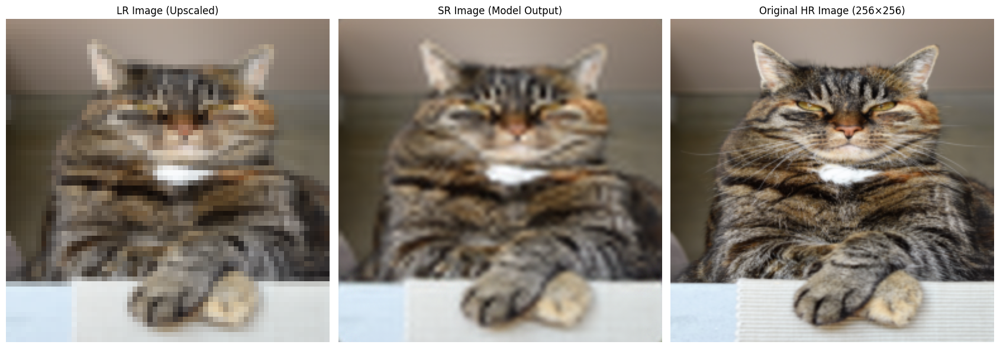

In [ ]:
# Set the path to the image folder
path = '/content/DIV2K_valid_HR/DIV2K_valid_HR'

# Load only the 69th image (index 68)
first_file = sorted(os.listdir(path))[68]
img_path = os.path.join(path, first_file)

# Read the image and reduce it to 256x256
img = resize(imread(img_path), (256, 256))

# צור גרסה ברזולוציה נמוכה (x4 downsample → 64x64)
img_lr = resize(img, (img.shape[0] // 4, img.shape[1] // 4), anti_aliasing=True)
img_lr = img_lr.astype(np.float32)
# המרת numpy ל-tensor עם Normalization [-1, 1]
to_tensor = transforms.ToTensor()
lr_tensor = to_tensor(img_lr).unsqueeze(0).to(device)

# 4. Model
model = MyEDSRNNModel(n_resblocks, n_channels, 0.1, scale)
model = model.to(device)
get_path = os.path.join(save_dir, "my_best_model.pth")
model.load_state_dict(torch.load(get_path, weights_only=False))

# ניבוי עם המודל
model.eval()
with torch.no_grad():
    sr_pred = model(lr_tensor)

# Convert back to numpy image
def tensor_to_img(t):
    t = t.squeeze(0).cpu()
    t = t.clamp(0, 1)  # מבטיח שהטווח נשאר חוקי
    img = t.permute(1, 2, 0).numpy()  # CHW → HWC
    return img

sr_img = tensor_to_img(sr_pred)

plt.figure(figsize=(17, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_lr)  # upscale LR for display
plt.title("LR Image (Upscaled)")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sr_img)
plt.title("SR Image (Model Output)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img)
plt.title("Original HR Image (256×256)")
plt.axis('off')
plt.tight_layout()
plt.show()


# 3.5.6) Crop qualitative examples:

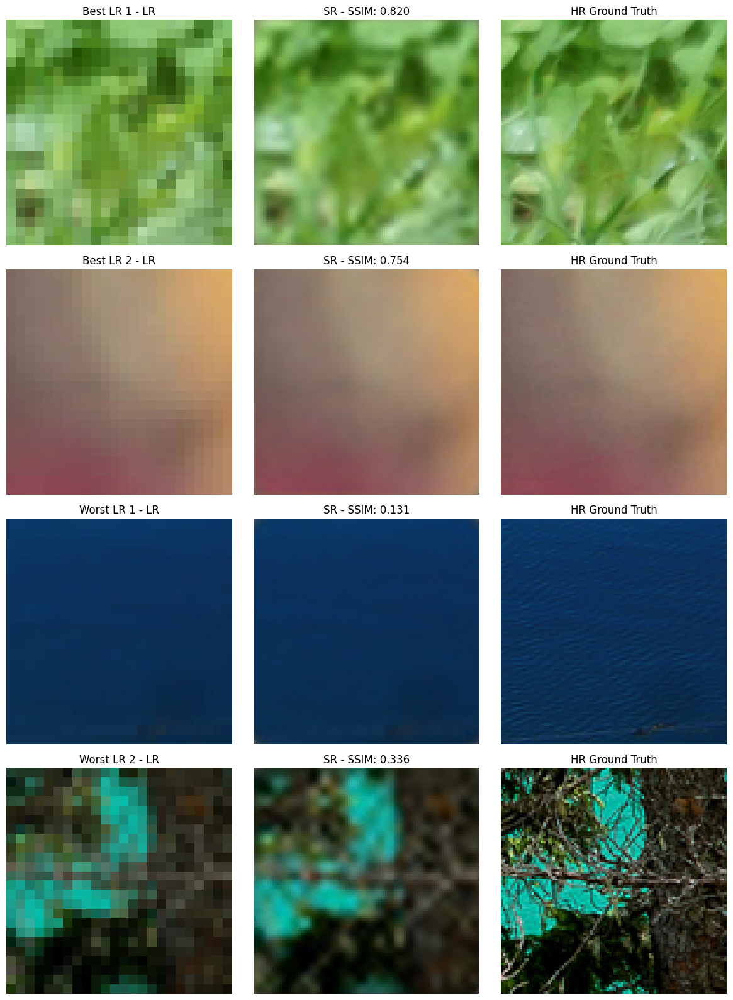

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def show_best_and_worst_sr_examples(model, dataset, device, check_range=10):
    model.eval()
    to_pil = transforms.ToPILImage()

    results = []

    for i in range(check_range):
        lr_img, hr_img = dataset[i]

        # Passes LR to the model
        lr_input = lr_img.unsqueeze(0).to(device)

        with torch.no_grad():
            sr_tensor = model(lr_input)

        # Returning images in the range [0, 1] instead of [-1, 1]
        lr_img_disp = lr_img.clamp(0, 1).cpu()
        sr_img_disp = sr_tensor.squeeze(0).clamp(0, 1).cpu()
        hr_img_disp = hr_img.clamp(0, 1).cpu()

        # Convert to NumPy
        lr_np = np.array(to_pil(lr_img_disp))
        sr_np = np.array(to_pil(sr_img_disp))
        hr_np = np.array(to_pil(hr_img_disp))

        # SSIM in data_range=1.0 (because we are in [0, 1])
        ssim_val = compare_ssim(hr_np, sr_np, channel_axis=2, data_range=1.0)

        results.append({
            'lr': lr_np,
            'sr': sr_np,
            'hr': hr_np,
            'ssim': ssim_val
        })

    # Sort by SSIM
    results.sort(key=lambda x: x['ssim'])

    # 2 best and 2 worst
    worst = results[:2]
    best = results[-2:][::-1]
    selected = best + worst

    # PLOT
    fig, axes = plt.subplots(len(selected), 3, figsize=(12, 4 * len(selected)))
    titles = ['Best LR 1', 'Best LR 2', 'Worst LR 1', 'Worst LR 2']

    for i, sample in enumerate(selected):
        axes[i, 0].imshow(sample['lr'])
        axes[i, 0].set_title(f"{titles[i]} - LR")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sample['sr'])
        axes[i, 1].set_title(f"SR - SSIM: {sample['ssim']:.3f}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(sample['hr'])
        axes[i, 2].set_title("HR Ground Truth")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

dataset_mine = MyModelDataset(data_folder='./', split= 'valid', crop_size=96, scale=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MyEDSRNNModel(n_resblocks=32, n_channels=256, res_scale=0.1, scale=scale).to(device)
model.load_state_dict(torch.load(os.path.join(save_dir, "my_best_model.pth")))
show_best_and_worst_sr_examples(model, dataset_mine, device, check_range=20)



# 3.5.6) Qualitative examples showing both successful and failed predictions

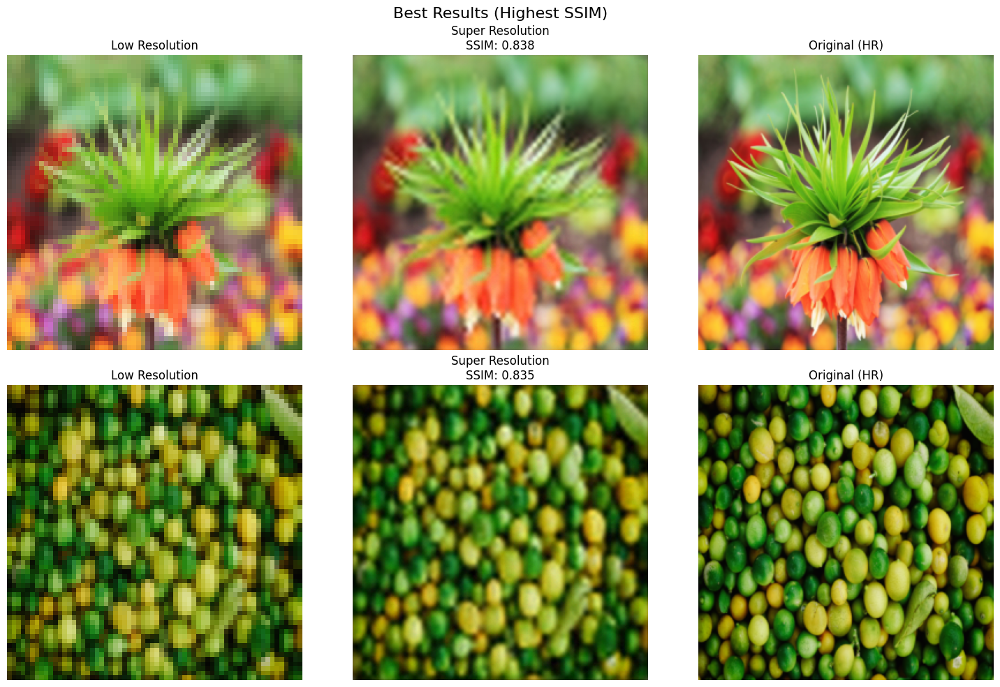

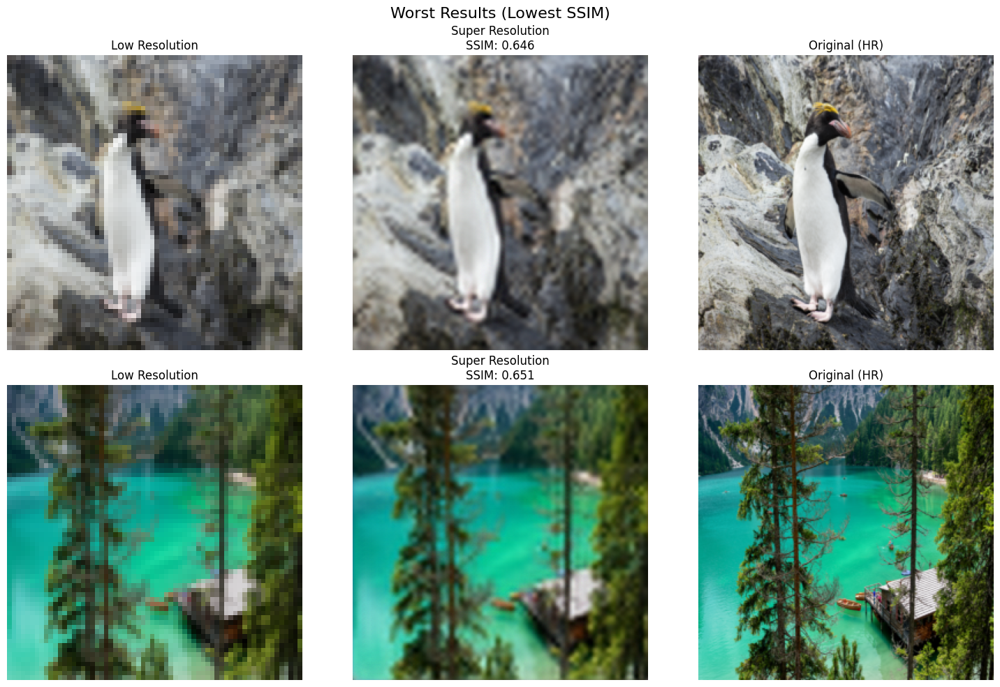

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
image_folder = '/content/DIV2K_valid_HR/DIV2K_valid_HR'
scale = 4
resize_to = 256

model = MyEDSRNNModel(n_resblocks=32, n_channels=256, res_scale=0.1, scale=scale).to(device)
model.load_state_dict(torch.load(os.path.join(save_dir, "my_best_model.pth")))
model.eval()

# Transformations
to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

results = []

# Process multiple images for testing
for file in sorted(os.listdir(image_folder))[:10]:
    img_path = os.path.join(image_folder, file)
    img = Image.open(img_path).convert('RGB')


    # Read the image and reduce it to 256x256
    img = resize(imread(img_path), (256, 256))

   # Create a low-resolution version (x4 downsample → 64x64)
    img_lr = resize(img, (img.shape[0] // 4, img.shape[1] // 4), anti_aliasing=True)
    img_lr = img_lr.astype(np.float32)

    to_tensor = transforms.ToTensor()
    lr_tensor = to_tensor(img_lr).unsqueeze(0).to(device)


    # Running the model
    with torch.no_grad():
        sr_tensor = model(lr_tensor)


    sr_img = sr_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    # Clamp the SR image to [0, 1] range
    sr_img = np.clip(sr_img, 0, 1)
    img = np.clip(img, 0, 1)
    # Same for img_lr if needed
    img_lr = np.clip(img_lr, 0, 1)
    # Calculate SSIM between SR and the original image
    ssim_val = compare_ssim(img, sr_img, channel_axis=2, data_range=1.0)

    results.append({
        'ssim': ssim_val,
        'lr': img_lr ,
        'sr': sr_img,
        'hr': img
    })

# Sort SSIM
results.sort(key=lambda x: x['ssim'])

worst = results[:2]
best = results[-2:][::-1]

# Plot Function
def plot_comparison(samples, title):
    fig, axes = plt.subplots(len(samples), 3, figsize=(15, 5 * len(samples)))
    for i, sample in enumerate(samples):
        axes[i, 0].imshow(sample['lr'])
        axes[i, 0].set_title("Low Resolution")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sample['sr'])
        axes[i, 1].set_title(f"Super Resolution\nSSIM: {sample['ssim']:.3f}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(sample['hr'])
        axes[i, 2].set_title("Original (HR)")
        axes[i, 2].axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# plot
plot_comparison(best, "Best Results (Highest SSIM)")
plot_comparison(worst, "Worst Results (Lowest SSIM)")


##3.6 Show four examples of images (qualitative comperation):

#• One where both models performed well.
#• One where both models performed poorly.
#• One where Model 1 performed well and Model 2 did not (if none, please state).
#• One where Model 2 performed well and Model 1 did not (if none, please state)

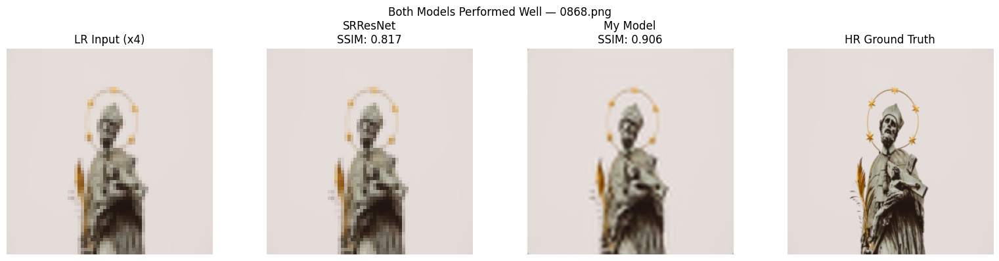

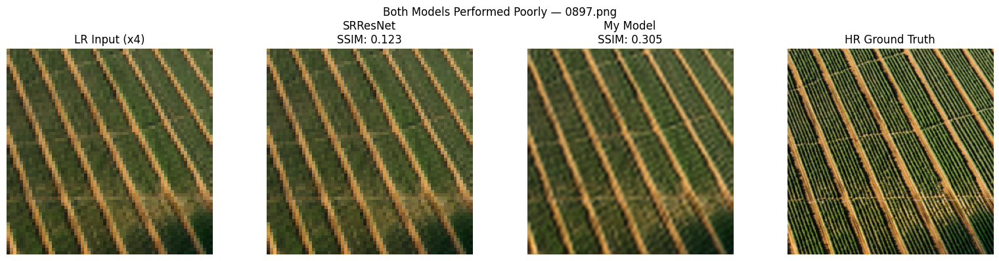

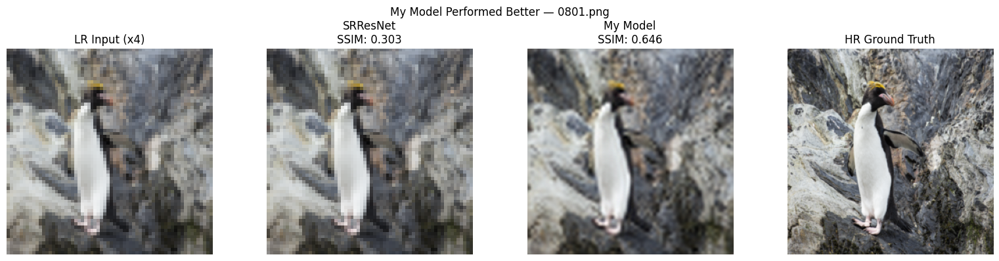

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.transform import resize
from skimage.metrics import structural_similarity as compare_ssim
from torchvision import transforms


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
image_folder = './DIV2K_valid_HR/DIV2K_valid_HR'
scale = 4
resize_to = 256
# Load the model
checkpoint_path = os.path.join(save_dir, "checkpoint_srresnet.pth.tar")
checkpoint = torch.load(checkpoint_path, weights_only=False)
model_srresnet = checkpoint['model'].to(device)

model_mine = MyEDSRNNModel(n_resblocks=32, n_channels=256, res_scale=0.1, scale=scale).to(device)
model_mine.load_state_dict(torch.load(os.path.join(save_dir, "my_best_model.pth")))


examples = []
image_files = sorted(os.listdir(image_folder))[:100]

for file in image_files:
    img_path = os.path.join(image_folder, file)

    # Read the image and reduce it to 256x256
    hr_np = resize(imread(img_path), (256, 256))

    # Create a low-resolution version (x4 downsample → 64x64)
    img_lr = resize(hr_np, (hr_np.shape[0] // 4, hr_np.shape[1] // 4), anti_aliasing=True)
    lr_np = img_lr.astype(np.float32)

    to_tensor = transforms.ToTensor()
    # prepare inputs
    # Convert the image to a suitable input for the model
    lr_srresnet = torch.tensor(img_lr).permute(2, 0, 1).unsqueeze(0).float().to(device)
    lr_mine = to_tensor(lr_np).unsqueeze(0).to(device)

    model_srresnet.eval()
    with torch.no_grad():
        sr1_tensor = model_srresnet(lr_srresnet)

    model_mine.eval()
    with torch.no_grad():
        sr2_tensor = model_mine(lr_mine)

    # De-normalize SRResNet output back to [0, 1]
    sr1_np = sr1_tensor.squeeze().cpu().numpy().transpose(1, 2, 0)
    sr1_np = (sr1_np - sr1_np.min()) / (sr1_np.max() - sr1_np.min())

    # Convert back to numpy image
    def tensor_to_img(t):
        t = t.squeeze(0).cpu()
        t = t.clamp(0, 1)  # [0,1]
        img = t.permute(1, 2, 0).numpy()  # CHW → HWC
        return img
    # Convert to numpy for SSIM and plot
    sr2_np = tensor_to_img(sr2_tensor)

    ssim1 = compare_ssim(hr_np, sr1_np, channel_axis=2, data_range=1.0)
    ssim2 = compare_ssim(hr_np, sr2_np, channel_axis=2, data_range=1.0)

    examples.append({
        'filename': file,
        'lr': lr_np,
        'hr': hr_np,
        'sr1': sr1_np,
        'sr2': sr2_np,
        'ssim1': ssim1,
        'ssim2': ssim2
    })

# Categorize
both_good = [ex for ex in examples if ex['ssim1'] > 0.70 and ex['ssim2'] > 0.70]
both_bad = [ex for ex in examples if ex['ssim1'] < 0.50 and ex['ssim2'] < 0.50]
model1_better = [ex for ex in examples if ex['ssim1'] - ex['ssim2'] > 0.2]
model2_better = [ex for ex in examples if ex['ssim2'] - ex['ssim1'] > 0.2]

def show_example(example, title):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    axes[0].imshow(example['lr'])
    axes[0].set_title("LR Input (x4)")
    axes[1].imshow(example['lr'])
    axes[1].set_title(f"SRResNet\nSSIM: {example['ssim1']:.3f}")
    axes[2].imshow(example['sr2'])
    axes[2].set_title(f"My Model\nSSIM: {example['ssim2']:.3f}")
    axes[3].imshow(example['hr'])
    axes[3].set_title("HR Ground Truth")
    for ax in axes:
        ax.axis('off')
    plt.suptitle(title + f" — {example['filename']}")
    plt.tight_layout()
    plt.show()

if both_good:
    show_example(both_good[0], "Both Models Performed Well")
if both_bad:
    show_example(both_bad[0], "Both Models Performed Poorly")
if model1_better:
    show_example(model1_better[0], "SRResNet Performed Better")
if model2_better:
    show_example(model2_better[0], "My Model Performed Better")



## 3.7 Ablation Studies

# 3.7.1

In [ ]:
# Learning rate
lr = 1e-4

# 4. Model
model = MyEDSRNNModel(n_resblocks, n_channels, 0.1, scale)
model = model.to(device)

# Define a new MSE loss function
criterion = nn.MSELoss()

# Call the training function with the new function
ablated_history = train_model_func(criterion=criterion, modelType=2)

# save to file
with open(os.path.join(save_dir, 'ablated_model_training_history.pkl'), 'wb') as f:
    pickle.dump( ablated_history, f)

print("Training history saved.")

No checkpoint found. Starting training from scratch.


100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


Training Loss: 0.0372, Validation Loss: 0.0124
Epoch 1 -- PSNR: 26.59, SSIM: 0.6606, FID: 309.10
New best model saved with PSNR: 26.59 dB and loss: 0.0124


100%|██████████| 2/2 [00:00<00:00,  3.47it/s]


Training Loss: 0.0084, Validation Loss: 0.0073
Epoch 2 -- PSNR: 29.18, SSIM: 0.7289, FID: 300.85
New best model saved with PSNR: 29.18 dB and loss: 0.0073


100%|██████████| 2/2 [00:00<00:00,  3.87it/s]


Training Loss: 0.0059, Validation Loss: 0.0050
Epoch 3 -- PSNR: 30.72, SSIM: 0.7685, FID: 290.21
New best model saved with PSNR: 30.72 dB and loss: 0.0050


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


Training Loss: 0.0051, Validation Loss: 0.0049
Epoch 4 -- PSNR: 31.52, SSIM: 0.7928, FID: 286.36
New best model saved with PSNR: 31.52 dB and loss: 0.0049


100%|██████████| 2/2 [00:00<00:00,  3.24it/s]


Training Loss: 0.0041, Validation Loss: 0.0037
Epoch 5 -- PSNR: 32.36, SSIM: 0.8226, FID: 260.28
New best model saved with PSNR: 32.36 dB and loss: 0.0037


100%|██████████| 2/2 [00:00<00:00,  3.82it/s]


Training Loss: 0.0042, Validation Loss: 0.0040
Epoch 6 -- PSNR: 31.91, SSIM: 0.8113, FID: 258.97


100%|██████████| 2/2 [00:00<00:00,  3.84it/s]


Training Loss: 0.0042, Validation Loss: 0.0041
Epoch 7 -- PSNR: 33.91, SSIM: 0.8340, FID: 238.05
New best model saved with PSNR: 33.91 dB and loss: 0.0041


100%|██████████| 2/2 [00:00<00:00,  3.83it/s]


Training Loss: 0.0040, Validation Loss: 0.0044
Epoch 8 -- PSNR: 32.71, SSIM: 0.8168, FID: 225.93


100%|██████████| 2/2 [00:00<00:00,  3.84it/s]


Training Loss: 0.0034, Validation Loss: 0.0035
Epoch 9 -- PSNR: 34.12, SSIM: 0.8465, FID: 205.01
New best model saved with PSNR: 34.12 dB and loss: 0.0035


100%|██████████| 2/2 [00:00<00:00,  3.42it/s]


Training Loss: 0.0036, Validation Loss: 0.0037
Epoch 10 -- PSNR: 34.24, SSIM: 0.8323, FID: 204.97
New best model saved with PSNR: 34.24 dB and loss: 0.0037


100%|██████████| 2/2 [00:00<00:00,  3.79it/s]


Training Loss: 0.0035, Validation Loss: 0.0037
Epoch 11 -- PSNR: 34.51, SSIM: 0.8385, FID: 195.50
New best model saved with PSNR: 34.51 dB and loss: 0.0037


100%|██████████| 2/2 [00:00<00:00,  3.80it/s]


Training Loss: 0.0036, Validation Loss: 0.0036
Epoch 12 -- PSNR: 33.74, SSIM: 0.8365, FID: 196.05


100%|██████████| 2/2 [00:00<00:00,  3.73it/s]


Training Loss: 0.0033, Validation Loss: 0.0028
Epoch 13 -- PSNR: 34.42, SSIM: 0.8502, FID: 196.91
New best model saved with PSNR: 34.42 dB and loss: 0.0028


100%|██████████| 2/2 [00:00<00:00,  3.62it/s]


Training Loss: 0.0032, Validation Loss: 0.0036
Epoch 14 -- PSNR: 34.68, SSIM: 0.8469, FID: 193.31
New best model saved with PSNR: 34.68 dB and loss: 0.0036


100%|██████████| 2/2 [00:00<00:00,  3.73it/s]


Training Loss: 0.0032, Validation Loss: 0.0032
Epoch 15 -- PSNR: 34.34, SSIM: 0.8348, FID: 188.05


100%|██████████| 2/2 [00:00<00:00,  3.83it/s]


Training Loss: 0.0033, Validation Loss: 0.0031
Epoch 16 -- PSNR: 34.93, SSIM: 0.8429, FID: 184.38
New best model saved with PSNR: 34.93 dB and loss: 0.0031


100%|██████████| 2/2 [00:00<00:00,  3.71it/s]


Training Loss: 0.0034, Validation Loss: 0.0038
Epoch 17 -- PSNR: 33.40, SSIM: 0.8300, FID: 198.12


100%|██████████| 2/2 [00:00<00:00,  3.78it/s]


Training Loss: 0.0031, Validation Loss: 0.0039
Epoch 18 -- PSNR: 34.69, SSIM: 0.8462, FID: 194.02


100%|██████████| 2/2 [00:00<00:00,  3.47it/s]


Training Loss: 0.0033, Validation Loss: 0.0034
Epoch 19 -- PSNR: 34.61, SSIM: 0.8529, FID: 189.10


100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Training Loss: 0.0033, Validation Loss: 0.0032
Epoch 20 -- PSNR: 34.59, SSIM: 0.8419, FID: 183.19


100%|██████████| 2/2 [00:00<00:00,  3.84it/s]


Training Loss: 0.0030, Validation Loss: 0.0028
Epoch 21 -- PSNR: 35.53, SSIM: 0.8563, FID: 177.88
New best model saved with PSNR: 35.53 dB and loss: 0.0028


100%|██████████| 2/2 [00:00<00:00,  3.80it/s]


Training Loss: 0.0033, Validation Loss: 0.0041
Epoch 22 -- PSNR: 35.04, SSIM: 0.8550, FID: 168.24


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


Training Loss: 0.0032, Validation Loss: 0.0032
Epoch 23 -- PSNR: 35.32, SSIM: 0.8634, FID: 174.48


100%|██████████| 2/2 [00:00<00:00,  3.38it/s]


Training Loss: 0.0033, Validation Loss: 0.0035
Epoch 24 -- PSNR: 34.89, SSIM: 0.8439, FID: 178.15


100%|██████████| 2/2 [00:00<00:00,  3.59it/s]


Training Loss: 0.0034, Validation Loss: 0.0031
Epoch 25 -- PSNR: 34.80, SSIM: 0.8471, FID: 192.28


100%|██████████| 2/2 [00:00<00:00,  3.82it/s]


Training Loss: 0.0032, Validation Loss: 0.0030
Epoch 26 -- PSNR: 34.90, SSIM: 0.8490, FID: 183.57


100%|██████████| 2/2 [00:00<00:00,  3.82it/s]


Training Loss: 0.0033, Validation Loss: 0.0037
Epoch 27 -- PSNR: 34.80, SSIM: 0.8472, FID: 187.78


100%|██████████| 2/2 [00:00<00:00,  3.73it/s]


Training Loss: 0.0033, Validation Loss: 0.0035
Epoch 28 -- PSNR: 34.82, SSIM: 0.8447, FID: 190.24


100%|██████████| 2/2 [00:00<00:00,  3.80it/s]


Training Loss: 0.0033, Validation Loss: 0.0042
Epoch 29 -- PSNR: 35.01, SSIM: 0.8494, FID: 174.33


100%|██████████| 2/2 [00:00<00:00,  3.36it/s]


Training Loss: 0.0033, Validation Loss: 0.0032
Epoch 30 -- PSNR: 35.67, SSIM: 0.8588, FID: 178.34
New best model saved with PSNR: 35.67 dB and loss: 0.0032


100%|██████████| 2/2 [00:00<00:00,  3.84it/s]


Training Loss: 0.0033, Validation Loss: 0.0028
Epoch 31 -- PSNR: 36.23, SSIM: 0.8600, FID: 165.60
New best model saved with PSNR: 36.23 dB and loss: 0.0028


100%|██████████| 2/2 [00:00<00:00,  3.32it/s]


Training Loss: 0.0034, Validation Loss: 0.0035
Epoch 32 -- PSNR: 35.99, SSIM: 0.8580, FID: 180.06


100%|██████████| 2/2 [00:00<00:00,  3.83it/s]


Training Loss: 0.0032, Validation Loss: 0.0031
Epoch 33 -- PSNR: 36.13, SSIM: 0.8575, FID: 174.36


100%|██████████| 2/2 [00:00<00:00,  3.78it/s]


Training Loss: 0.0033, Validation Loss: 0.0032
Epoch 34 -- PSNR: 36.01, SSIM: 0.8630, FID: 173.95


100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Training Loss: 0.0035, Validation Loss: 0.0029
Epoch 35 -- PSNR: 35.36, SSIM: 0.8526, FID: 172.31


100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Training Loss: 0.0029, Validation Loss: 0.0035
Epoch 36 -- PSNR: 34.39, SSIM: 0.8447, FID: 185.12


100%|██████████| 2/2 [00:00<00:00,  3.78it/s]


Training Loss: 0.0033, Validation Loss: 0.0032
Epoch 37 -- PSNR: 35.12, SSIM: 0.8490, FID: 181.36


100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


Training Loss: 0.0031, Validation Loss: 0.0034
Epoch 38 -- PSNR: 35.72, SSIM: 0.8536, FID: 181.82


100%|██████████| 2/2 [00:00<00:00,  3.76it/s]


Training Loss: 0.0033, Validation Loss: 0.0034
Epoch 39 -- PSNR: 35.75, SSIM: 0.8605, FID: 168.39


100%|██████████| 2/2 [00:00<00:00,  3.80it/s]


Training Loss: 0.0032, Validation Loss: 0.0034
Epoch 40 -- PSNR: 34.83, SSIM: 0.8395, FID: 174.58


100%|██████████| 2/2 [00:00<00:00,  3.80it/s]


Training Loss: 0.0030, Validation Loss: 0.0037
Epoch 41 -- PSNR: 36.00, SSIM: 0.8586, FID: 173.09


100%|██████████| 2/2 [00:00<00:00,  3.75it/s]


Training Loss: 0.0031, Validation Loss: 0.0028
Epoch 42 -- PSNR: 36.02, SSIM: 0.8564, FID: 160.67


100%|██████████| 2/2 [00:00<00:00,  3.71it/s]


Training Loss: 0.0031, Validation Loss: 0.0029
Epoch 43 -- PSNR: 35.32, SSIM: 0.8551, FID: 179.63


100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


Training Loss: 0.0031, Validation Loss: 0.0032
Epoch 44 -- PSNR: 35.81, SSIM: 0.8619, FID: 177.22


100%|██████████| 2/2 [00:00<00:00,  3.79it/s]


Training Loss: 0.0032, Validation Loss: 0.0040
Epoch 45 -- PSNR: 34.30, SSIM: 0.8322, FID: 188.79


100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Training Loss: 0.0030, Validation Loss: 0.0025
Epoch 46 -- PSNR: 36.18, SSIM: 0.8645, FID: 171.49
New best model saved with PSNR: 36.18 dB and loss: 0.0025


100%|██████████| 2/2 [00:00<00:00,  3.32it/s]


Training Loss: 0.0033, Validation Loss: 0.0033
Epoch 47 -- PSNR: 35.31, SSIM: 0.8494, FID: 176.39


100%|██████████| 2/2 [00:00<00:00,  3.73it/s]


Training Loss: 0.0032, Validation Loss: 0.0027
Epoch 48 -- PSNR: 35.63, SSIM: 0.8605, FID: 172.93


100%|██████████| 2/2 [00:00<00:00,  3.88it/s]


Training Loss: 0.0030, Validation Loss: 0.0037
Epoch 49 -- PSNR: 35.16, SSIM: 0.8414, FID: 174.90


100%|██████████| 2/2 [00:00<00:00,  3.86it/s]


   Epoch       PSNR      SSIM         FID
0      0  26.587760  0.660607  309.096982
1     10  34.506134  0.838523  195.497272
2     20  35.525945  0.856320  177.879520
3     30  36.230540  0.859952  165.601224
4     40  36.004721  0.858586  173.087264
5     49  35.867668  0.863453  170.268673
Training Loss: 0.0030, Validation Loss: 0.0027
Epoch 50 -- PSNR: 35.87, SSIM: 0.8635, FID: 170.27
Training history saved.


#3.7.2) PLOT training loss curves for ablated versions model:

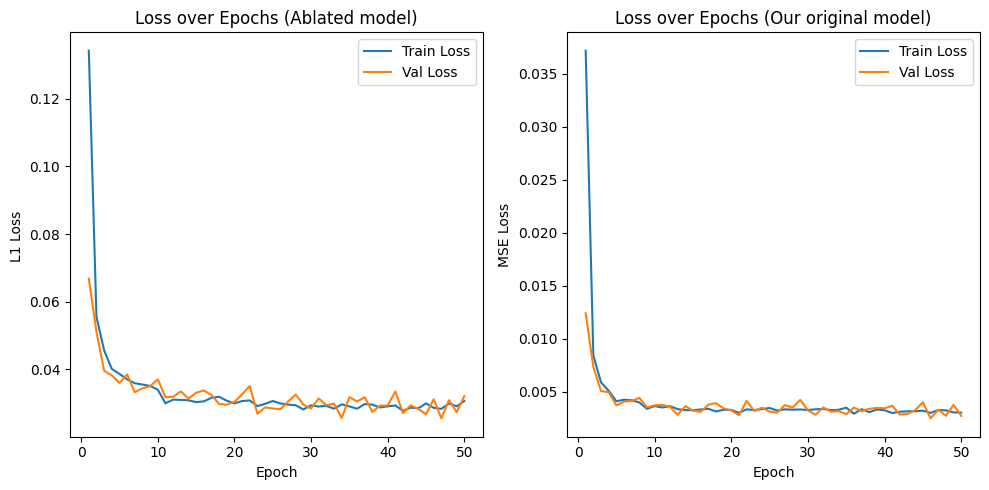

In [ ]:
# Load the saved history
with open(os.path.join(save_dir, 'ablated_model_training_history.pkl'), 'rb') as f:
    ablated_history = pickle.load(f)
ablated_train_losses =  ablated_history['train_losses']
ablated_val_losses =  ablated_history['val_losses']


# Load the saved history
with open(os.path.join(save_dir, 'my_model_training_history.pkl'), 'rb') as f:
    history = pickle.load(f)
train_losses = history['train_losses']
val_losses = history['val_losses']

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(10, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Val Loss')
plt.title('Loss over Epochs (Ablated model)')
plt.xlabel('Epoch')
plt.ylabel('L1 Loss ')
plt.legend()


# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, ablated_train_losses, label='Train Loss')
plt.plot(epochs_range, ablated_val_losses, label='Val Loss')
plt.title('Loss over Epochs (Our original model)')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()


plt.tight_layout()
plt.show()

#3.7.3) Report and Plot Quantitative performance metrics:

My Original metric model
   Epoch       PSNR      SSIM         FID
0      0  27.347474  0.684801  301.776321
1     10  34.513281  0.844996  182.514691
2     20  35.321822  0.857047  169.544478
3     30  35.287344  0.842427  177.073004
4     40  35.308998  0.853830  173.787831
5     49  35.812794  0.861978  163.069173 


My Ablated metric model
   Epoch       PSNR      SSIM         FID
0      0  26.587760  0.660607  309.096982
1     10  34.506134  0.838523  195.497272
2     20  35.525945  0.856320  177.879520
3     30  36.230540  0.859952  165.601224
4     40  36.004721  0.858586  173.087264
5     49  35.867668  0.863453  170.268673 




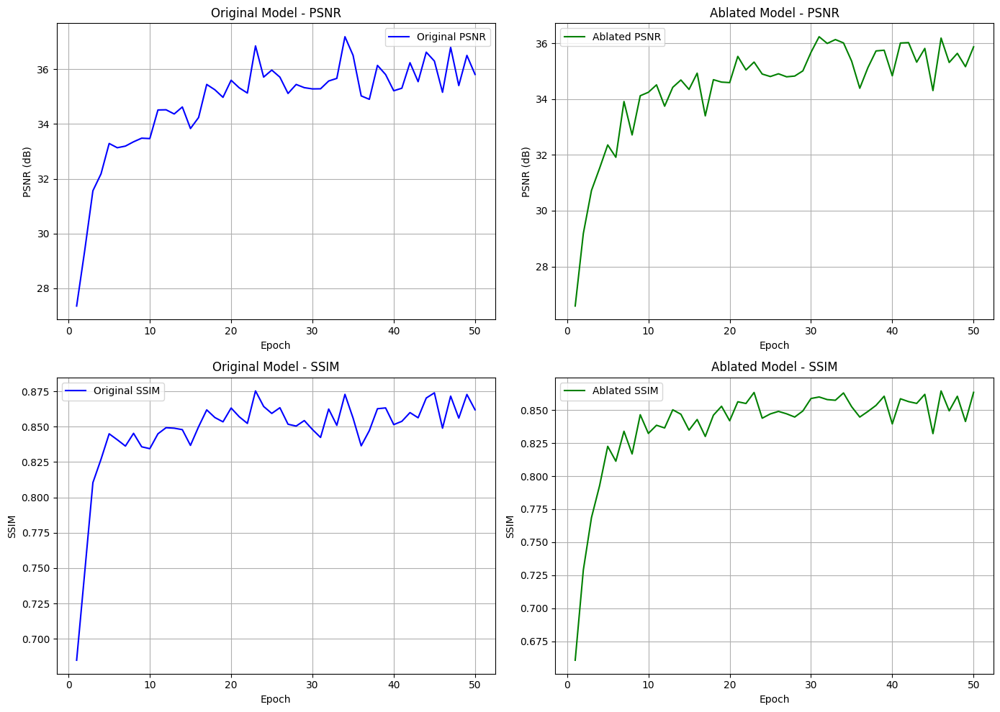

In [ ]:
ablated_csv_path = os.path.join(save_dir, 'my_ablated_model_training_metrics.csv')
my_csv_path = os.path.join(save_dir, 'my_model_training_metrics.csv')

# Reading the file into a DataFrame
my_metrics_df = pd.read_csv(my_csv_path)
ablated_metrics_df = pd.read_csv(ablated_csv_path)
print("My Original metric model")
print(my_metrics_df,"\n\n")
print("My Ablated metric model")
print(ablated_metrics_df,"\n\n")



# Load history of each models
val_psnrs = history['val_psnrs']
val_ssims = history['val_ssims']

ablated_val_psnrs = ablated_history['val_psnrs']
ablated_val_ssims = ablated_history['val_ssims']

epochs_range = range(1, len(train_losses) + 1)

plt.figure(figsize=(14, 10))

# 1. Original model - PSNR
plt.subplot(2, 2, 1)
plt.plot(epochs_range, val_psnrs, label='Original PSNR', color='blue')
plt.title('Original Model - PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()

# 2. Ablated model - PSNR
plt.subplot(2, 2, 2)
plt.plot(epochs_range, ablated_val_psnrs, label='Ablated PSNR', color='green')
plt.title('Ablated Model - PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()

# 3. Original model - SSIM
plt.subplot(2, 2, 3)
plt.plot(epochs_range, val_ssims, label='Original SSIM', color='blue')
plt.title('Original Model - SSIM')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.grid(True)
plt.legend()

# 4. Ablated model - SSIM
plt.subplot(2, 2, 4)
plt.plot(epochs_range, ablated_val_ssims, label='Ablated SSIM', color='green')
plt.title('Ablated Model - SSIM')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


#3.7.4) Qualitative examples to illustrate how the ablation affected performance:

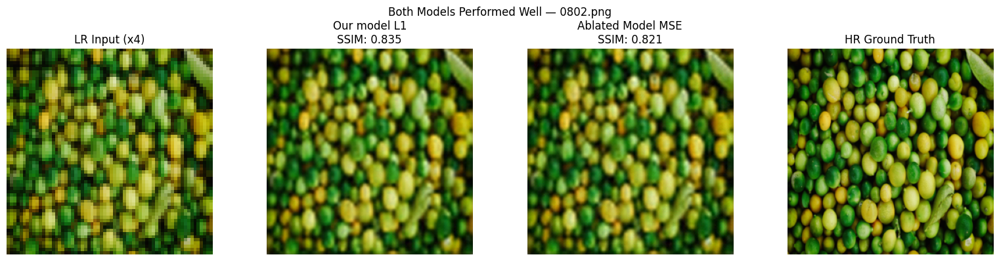

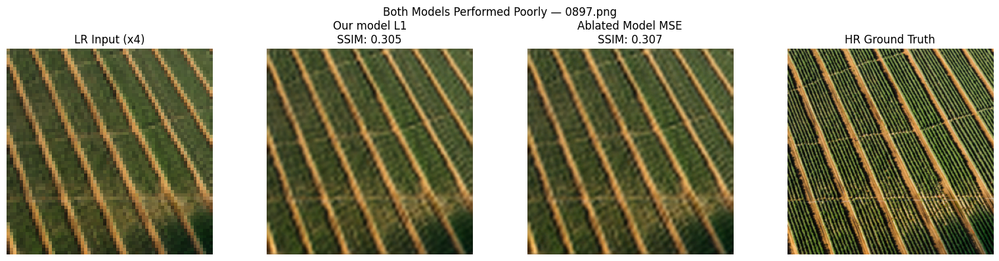

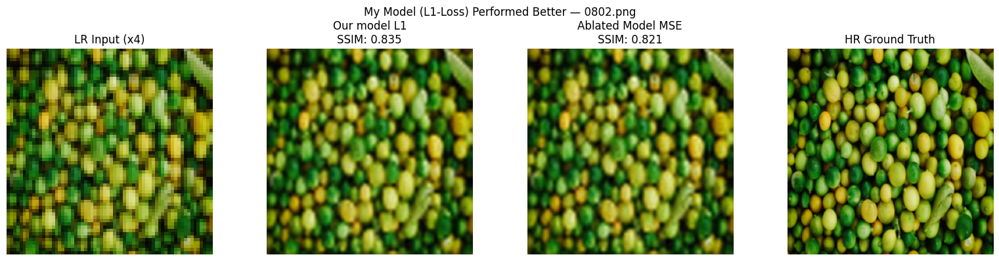

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.transform import resize
from skimage.metrics import structural_similarity as compare_ssim
from torchvision import transforms


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
image_folder = './DIV2K_valid_HR/DIV2K_valid_HR'
scale = 4
resize_to = 256
# Load the model

model_mine_L1 = MyEDSRNNModel(n_resblocks=32, n_channels=256, res_scale=0.1, scale=scale).to(device)
model_mine_L1.load_state_dict(torch.load(os.path.join(save_dir, "my_best_model.pth")))
model_ablated_MSE = model

examples = []
image_files = sorted(os.listdir(image_folder))[:100]

for file in image_files:
    img_path = os.path.join(image_folder, file)

    # Read the image and reduce it to 256x256
    hr_np = resize(imread(img_path), (256, 256))

    # Create a low-resolution version (x4 downsample → 64x64)
    img_lr = resize(hr_np, (hr_np.shape[0] // 4, hr_np.shape[1] // 4), anti_aliasing=True)
    lr_np = img_lr.astype(np.float32)

    to_tensor = transforms.ToTensor()
    # prepare inputs
    # Convert the image to a suitable input for the model
    lr_mine = to_tensor(lr_np).unsqueeze(0).to(device)


    model_mine_L1.eval()
    with torch.no_grad():
        sr1_tensor = model_mine_L1(to_tensor(lr_np).unsqueeze(0).to(device))

    model_ablated_MSE.eval()
    with torch.no_grad():
        sr2_tensor = model_ablated_MSE(to_tensor(lr_np).unsqueeze(0).to(device))

    # Convert back to numpy image
    def tensor_to_img(t):
        t = t.squeeze(0).cpu()
        t = t.clamp(0, 1)  # [0,1]
        img = t.permute(1, 2, 0).numpy()  # CHW → HWC
        return img

    # Convert to numpy for SSIM and plot
    sr1_np = tensor_to_img(sr1_tensor)
    sr2_np = tensor_to_img(sr2_tensor)

    ssim1 = compare_ssim(hr_np, sr1_np, channel_axis=2, data_range=1.0)
    ssim2 = compare_ssim(hr_np, sr2_np, channel_axis=2, data_range=1.0)

    examples.append({
        'filename': file,
        'lr': lr_np,
        'hr': hr_np,
        'sr1': sr1_np,
        'sr2': sr2_np,
        'ssim1': ssim1,
        'ssim2': ssim2
    })

# Categorize
both_good = [ex for ex in examples if ex['ssim1'] > 0.70 and ex['ssim2'] > 0.70]
both_bad = [ex for ex in examples if ex['ssim1'] < 0.50 and ex['ssim2'] < 0.50]
model1_better = [ex for ex in examples if ex['ssim1'] - ex['ssim2'] > 0.01]
model2_better = [ex for ex in examples if ex['ssim2'] - ex['ssim1'] >0.01]

def show_example(example, title):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    axes[0].imshow(example['lr'])
    axes[0].set_title("LR Input (x4)")
    axes[1].imshow(example['sr1'])
    axes[1].set_title(f"Our model L1\nSSIM: {example['ssim1']:.3f}")
    axes[2].imshow(example['sr2'])
    axes[2].set_title(f"Ablated Model MSE\nSSIM: {example['ssim2']:.3f}")
    axes[3].imshow(example['hr'])
    axes[3].set_title("HR Ground Truth")
    for ax in axes:
        ax.axis('off')
    plt.suptitle(title + f" — {example['filename']}")
    plt.tight_layout()
    plt.show()

if both_good:
    show_example(both_good[0], "Both Models Performed Well")
if both_bad:
    show_example(both_bad[0], "Both Models Performed Poorly")
if model1_better:
    show_example(model1_better[0], "My Model (L1-Loss) Performed Better")
if model2_better:
    show_example(model2_better[0], "ABLATED model (MSE)Performed Better")

